In [5]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import argparse
from evals.models import get_models_dict
from evals.models import Model
# from evals.generate_data import SampledData, generate_data
from evals.persistence import (
    RunResults,
    save_run_results,
    load_run_results,
    print_run_results,
)
from evals.utils import get_default_parameters
from evals.metrics import (
    evaluate_predicted_interactions,
    InteractionMetrics,
    evaluate_predicted_observations,
    ObservationMetrics,
)
from evals.models import DiiscoModel, RollingLinearModel, LinearModel

import os
import namesgenerator
import numpy as np
import uuid
import torch


from evals.__main__ import (
    parse_args, 
    make_model_config, 
    generate_run_name,
    create_and_return_save_pth
)

def generate_data():
    seed = 8
    np.random.seed(seed)

    n_timepoints = 100
    n_cells = 5

    lower_bound = 0
    upper_bound = 100

    timepoints = np.random.uniform(low=lower_bound, high=upper_bound, size=(n_timepoints))
    W = np.zeros((n_timepoints, n_cells, n_cells))

    W[:, 0, 0] = 1
    W[:, 1, 1] = 1
    W[:, 4, 0] = np.cos(timepoints/30)
    W[:, 2, 1] = np.cos((timepoints - 10)/30)
    W[:, 3, 0] = np.cos((timepoints + 20)/40)
    W[:, 3, 1] = np.cos((timepoints + 20)/40)
    W[:, 4, 2] = np.cos((timepoints + 10)/40)

    epsilon = np.random.normal(0, 0.5, (n_timepoints, n_cells))

    c1 = 0.5 * (np.cos((timepoints + 5)/3) + np.cos(timepoints/5)) + epsilon[:, 0]
    c2 = np.sin((timepoints + 1)/2) + np.cos(timepoints/3) + np.cos((timepoints + 0.5)/3) + epsilon[:, 1]
    
    c3 = W[:, 2, 1] * c2 + epsilon[:, 2]
    c4 = W[:, 3, 0] * c1 + W[:, 3, 1] * c2 + epsilon[:, 3]
    c5 = W[:, 4, 2] * c3 + W[:, 4, 0] * c1 + epsilon[:, 4]

    c1 = c1-np.mean(c1,axis=0)
    c2 = c2-np.mean(c2,axis=0)
    c3 = c3-np.mean(c3,axis=0)
    c4 = c4-np.mean(c4,axis=0)
    c5 = c5-np.mean(c5,axis=0)

    data = np.stack([c1, c2, c3, c4, c5], axis=1)
    
    print(data.shape)
    # Randomly drop data points
    #mask = np.random.rand(n_timepoints) > 0.2
    #data = data[mask]

    # sorty by timepoints
    sort_idx = np.argsort(timepoints)
    data = data[sort_idx,:]
    timepoints = timepoints[sort_idx]
    W = W[sort_idx,:,:]

    lambda_matrix = np.zeros((n_cells, n_cells))
    lambda_matrix[0, 0] = 1
    lambda_matrix[0, 1] = 1
    lambda_matrix[0, 2] = 1
    lambda_matrix[0, 3] = 1
    lambda_matrix[0, 4] = 1
    lambda_matrix[1, 1] = 1
    lambda_matrix[1, 2] = 1
    lambda_matrix[1, 3] = 1
    lambda_matrix[2, 4] = 1

    return timepoints, data, W, lambda_matrix.T

timepoints, data, W, lambda_matrix = generate_data()


(100, 5)


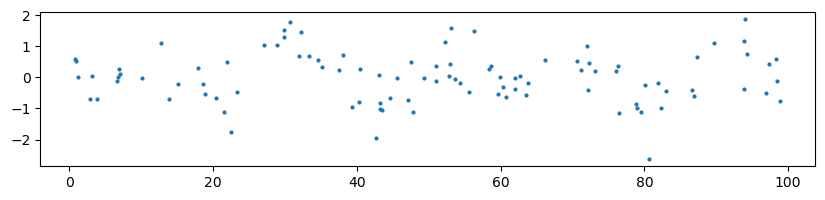

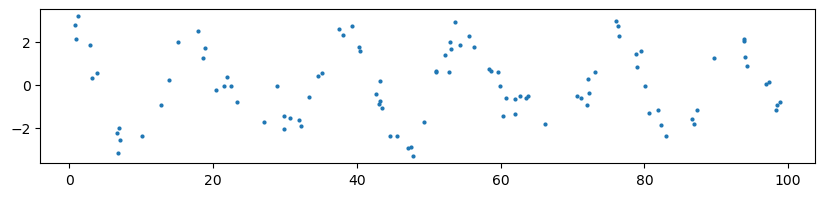

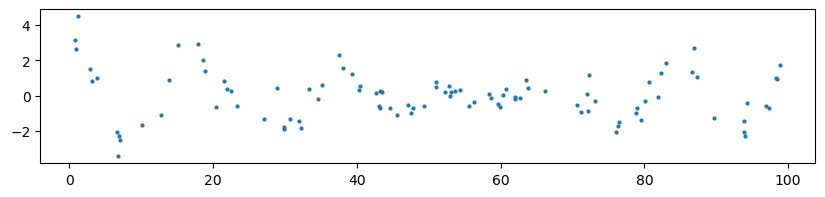

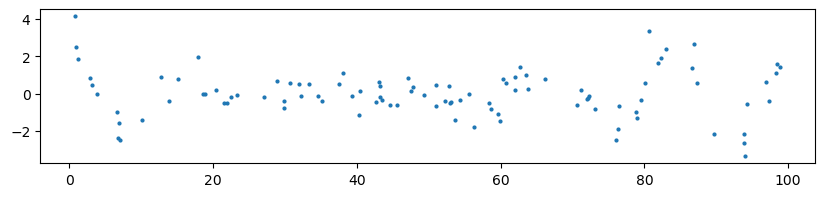

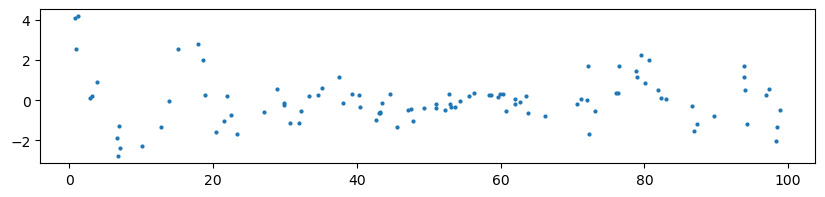

In [6]:
plt.figure(figsize = (10,2))
plt.scatter(timepoints, data[:,0], s = 4)
plt.show()

plt.figure(figsize = (10,2))
plt.scatter(timepoints, data[:,1], s = 4)
plt.show()

plt.figure(figsize = (10,2))
plt.scatter(timepoints, data[:,2], s = 4)
plt.show()

plt.figure(figsize = (10,2))
plt.scatter(timepoints, data[:,3], s = 4)
plt.show()

plt.figure(figsize = (10,2))
plt.scatter(timepoints, data[:,4], s = 4)
plt.show()

30 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 308.8825:  34%|██████▍            | 34023/100000 [01:06<02:08, 513.65it/s]


Early stopping at iteration 34024, loss: 308.8139


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
100%|███████████████████████████████████████| 1000/1000 [00:19<00:00, 51.69it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


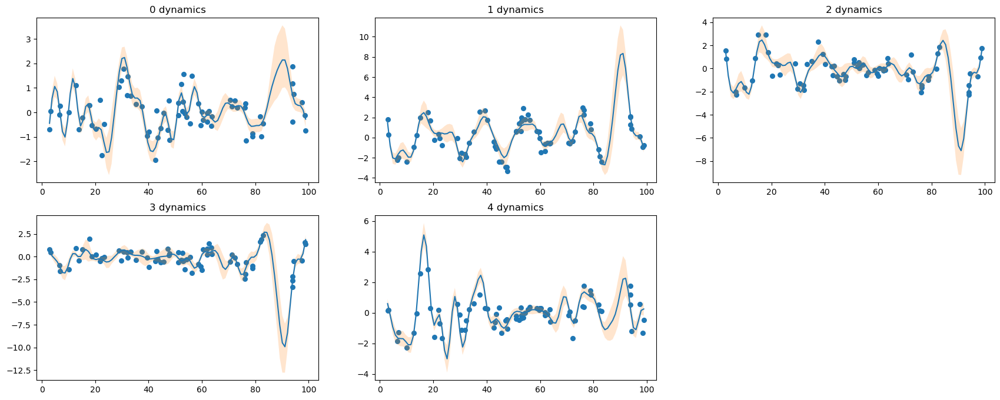

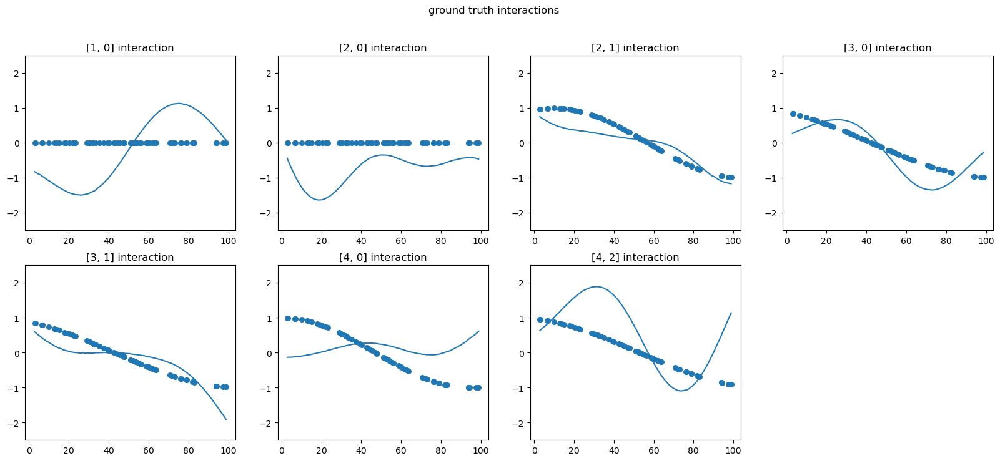

40 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 339.4774:  12%|██▎                | 12340/100000 [00:21<02:31, 579.36it/s]


Early stopping at iteration 12341, loss: 362.1122


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 58.03it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


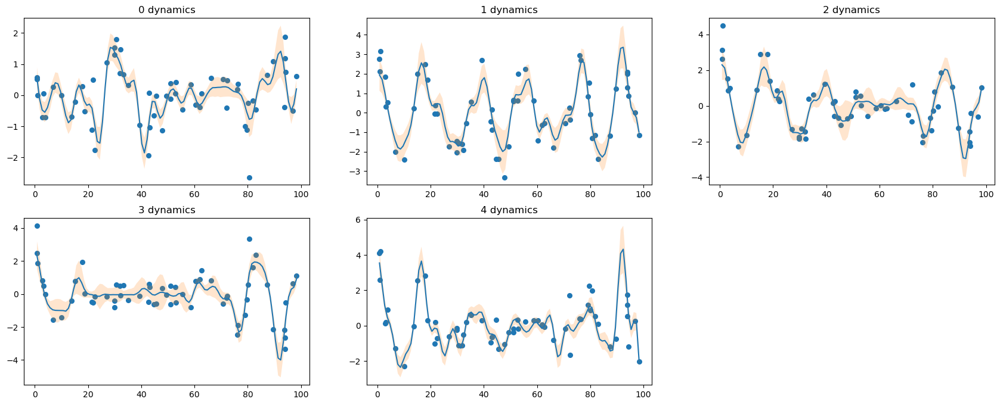

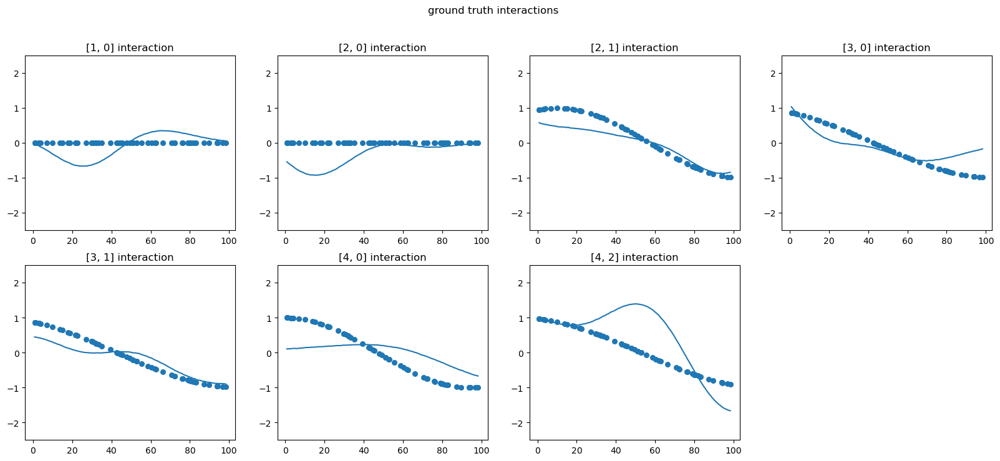

60 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 318.8927:  22%|████▎              | 22372/100000 [00:38<02:12, 584.89it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 22373, loss: 327.0902


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.62it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


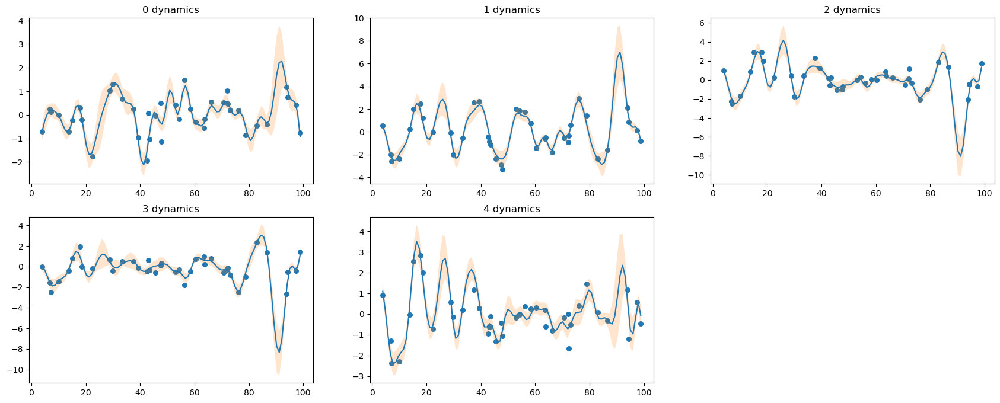

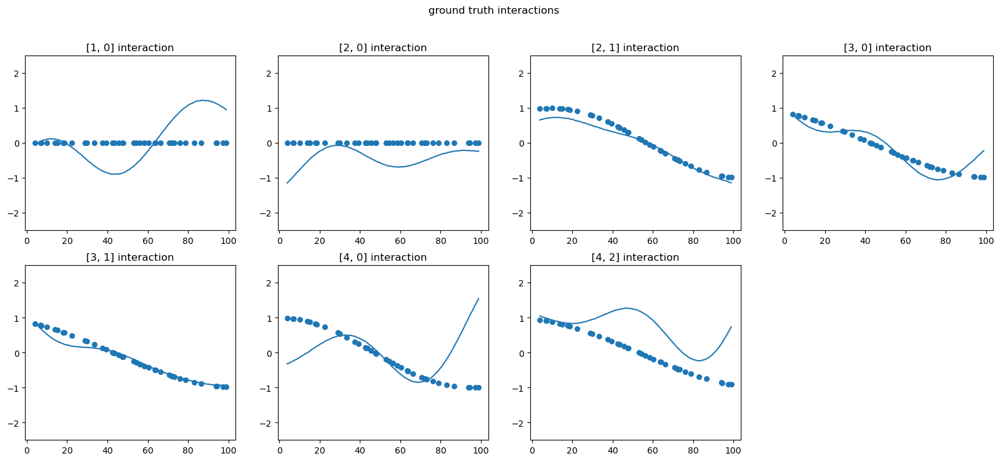

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 354.3869:  16%|███                | 15798/100000 [00:24<02:12, 635.27it/s]


Early stopping at iteration 15799, loss: 367.0022


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.97it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


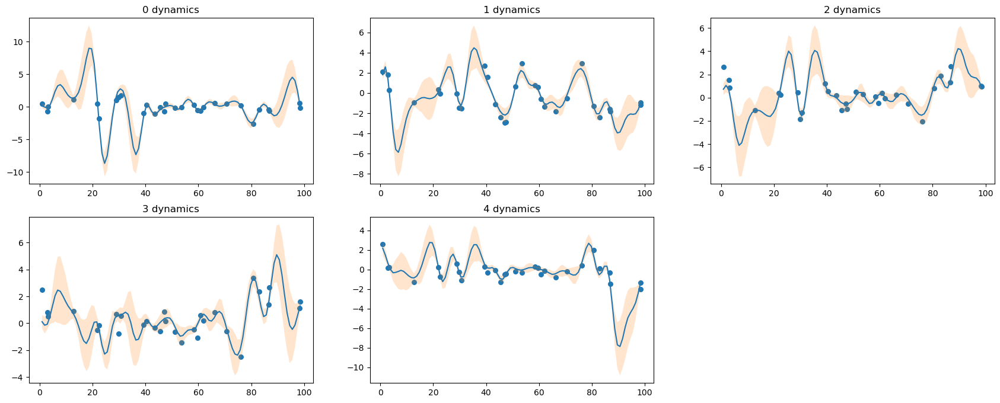

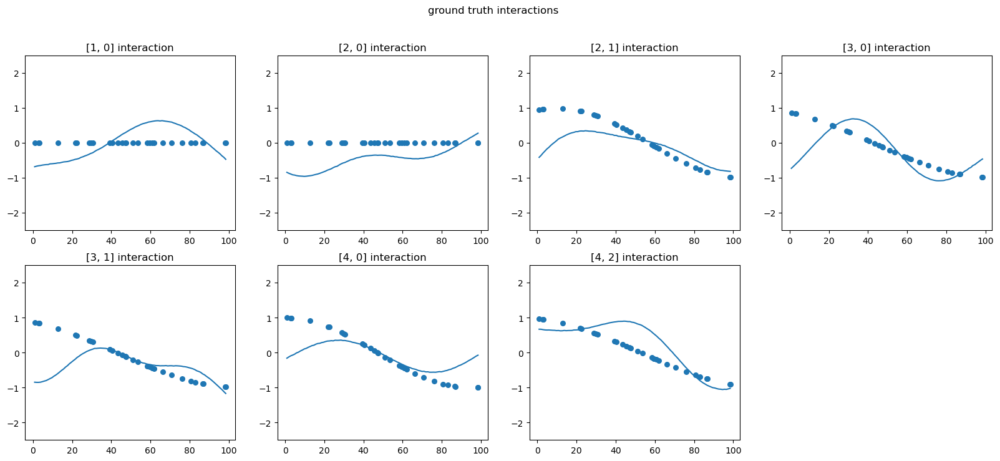

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 510.5105:  23%|████▍              | 23325/100000 [00:34<01:53, 673.12it/s]


Early stopping at iteration 23326, loss: 540.3238


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 58.77it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


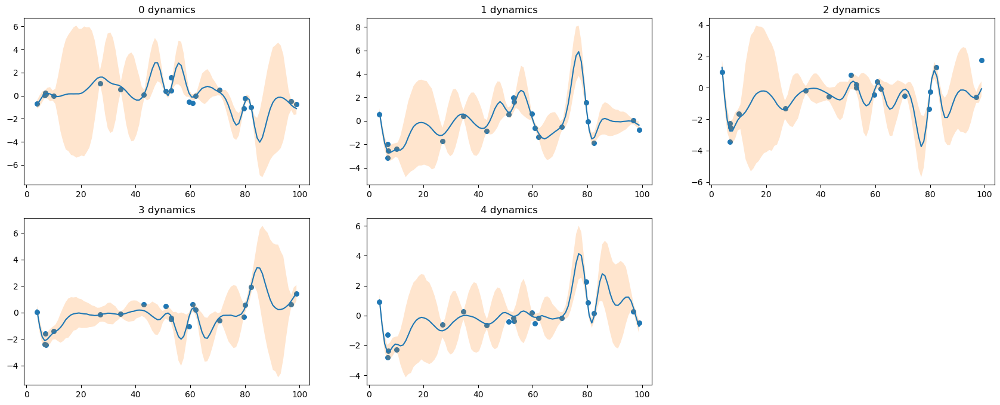

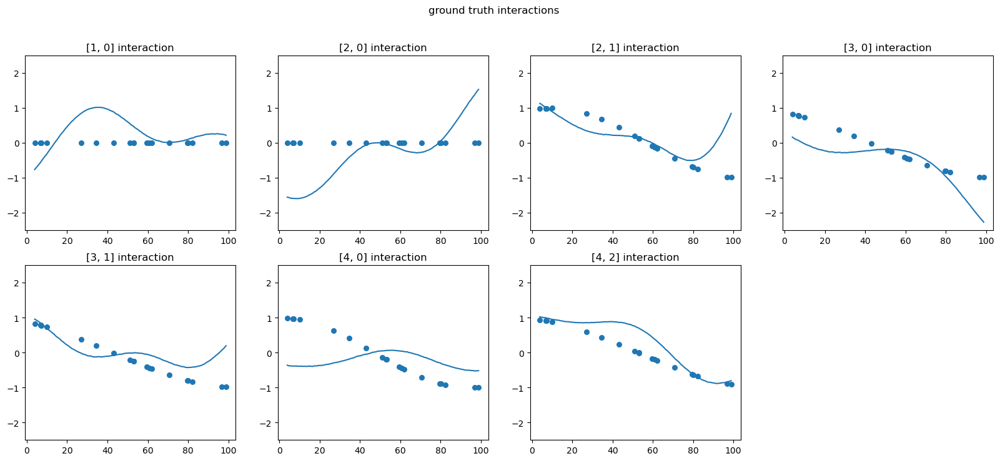

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 0--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 661.7985:  20%|███▋               | 19516/100000 [00:28<01:57, 686.91it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 19517, loss: 701.0887


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 61.76it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


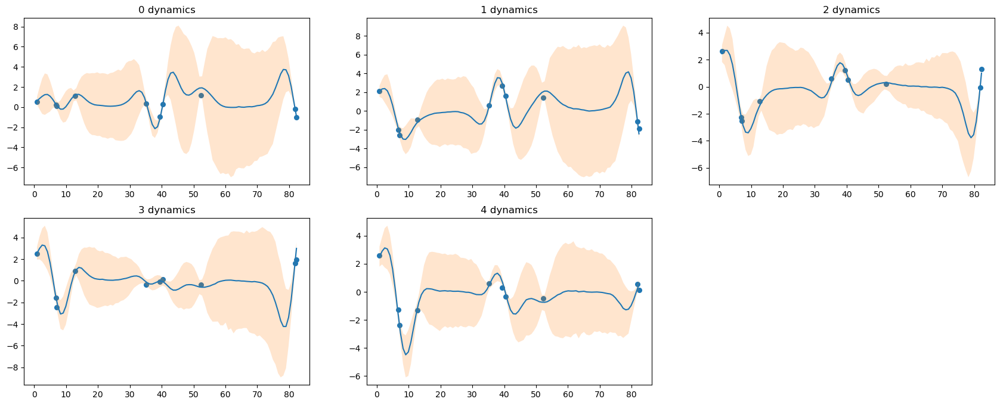

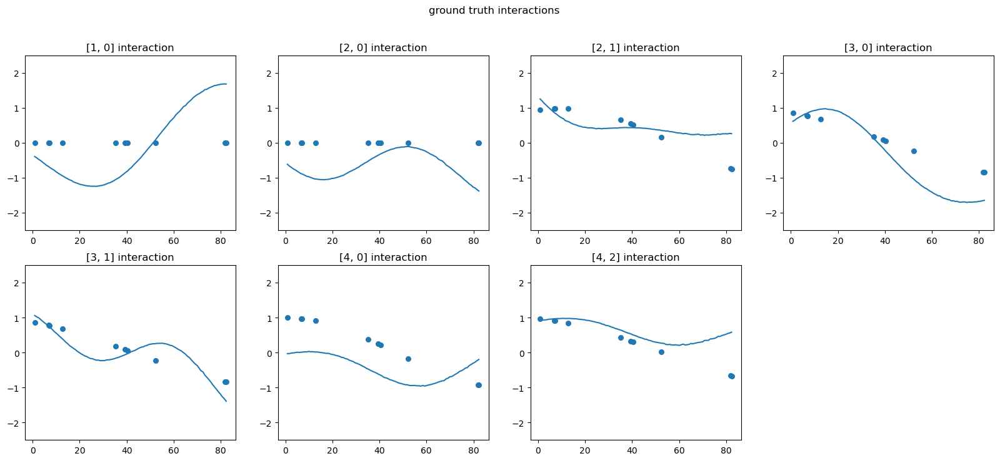

30 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 295.9039:  27%|█████▏             | 27449/100000 [00:54<02:23, 506.80it/s]


Early stopping at iteration 27450, loss: 296.3181


100%|███████████████████████████████████████| 1000/1000 [00:20<00:00, 48.22it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


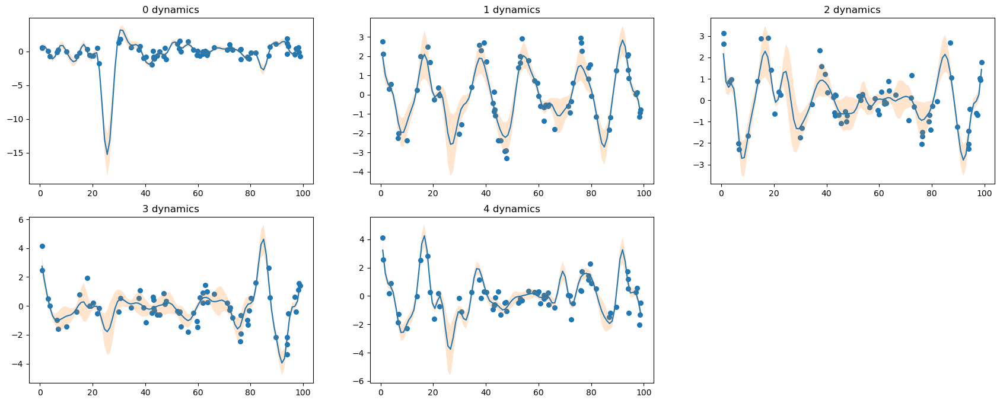

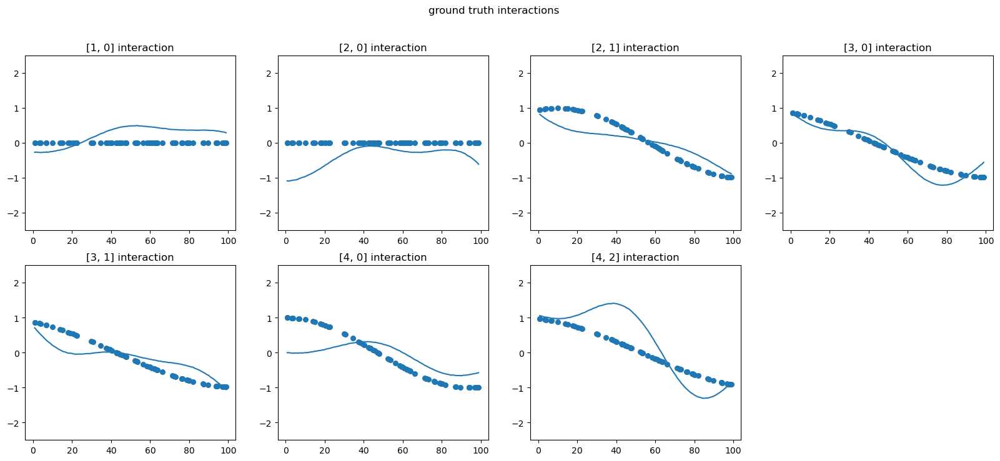

40 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 322.7352:  30%|█████▋             | 30165/100000 [00:52<02:00, 578.10it/s]


Early stopping at iteration 30166, loss: 329.3022


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 58.17it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


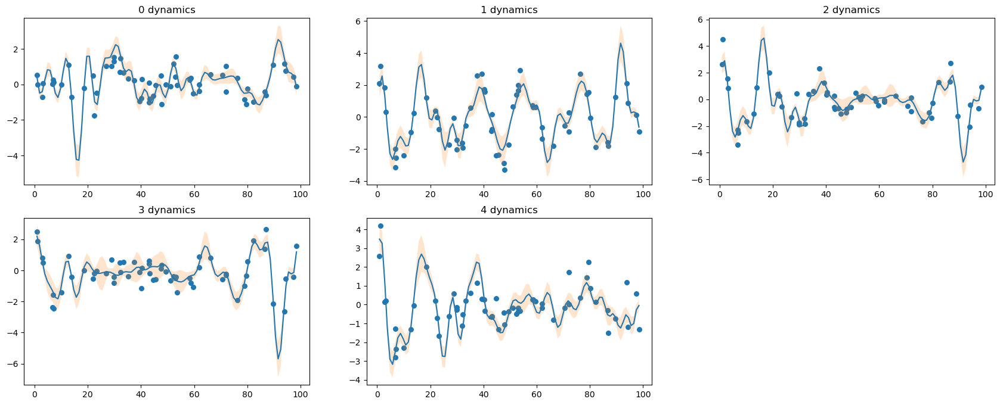

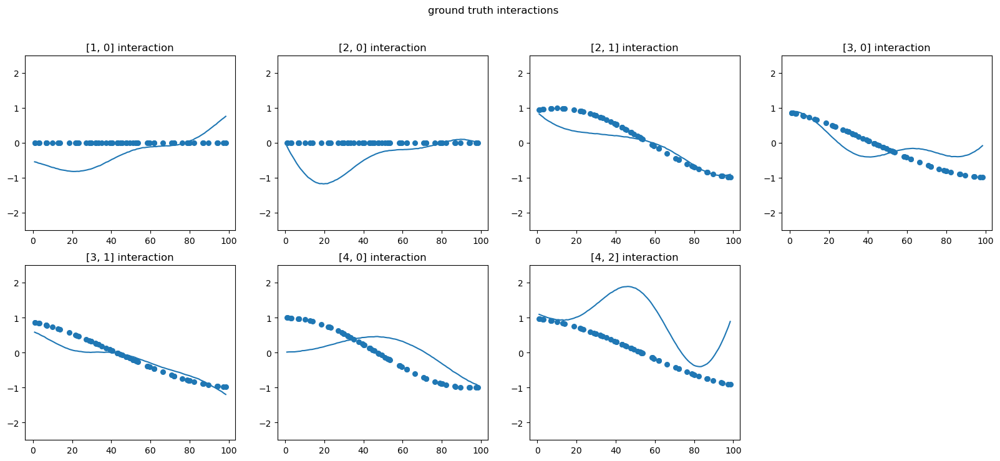

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 389.8281:  15%|██▊                | 14526/100000 [00:23<02:15, 629.81it/s]


Early stopping at iteration 14527, loss: 404.2505


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 62.37it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


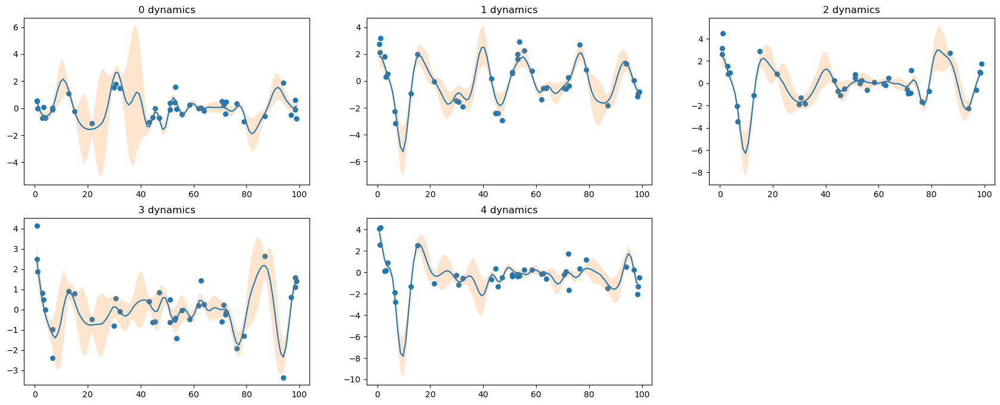

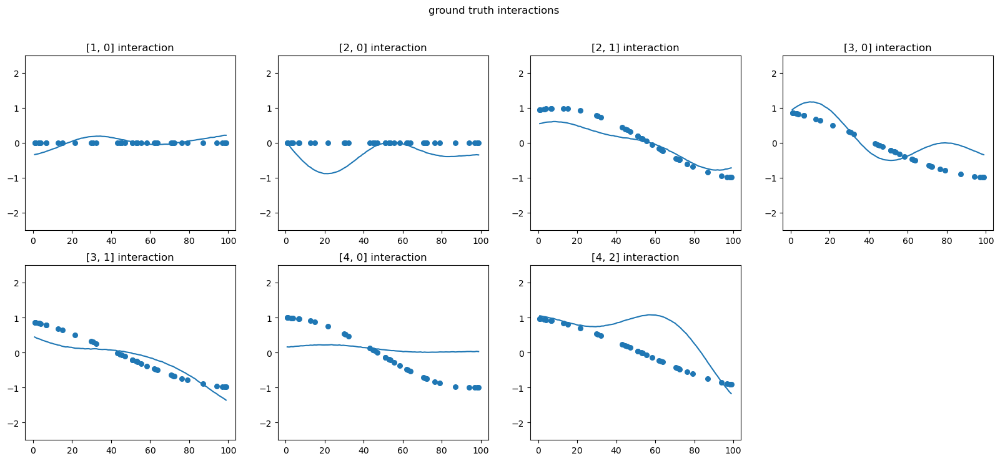

70 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 397.1444:  23%|████▎              | 22753/100000 [00:35<01:59, 647.49it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 22754, loss: 391.2601


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 63.52it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


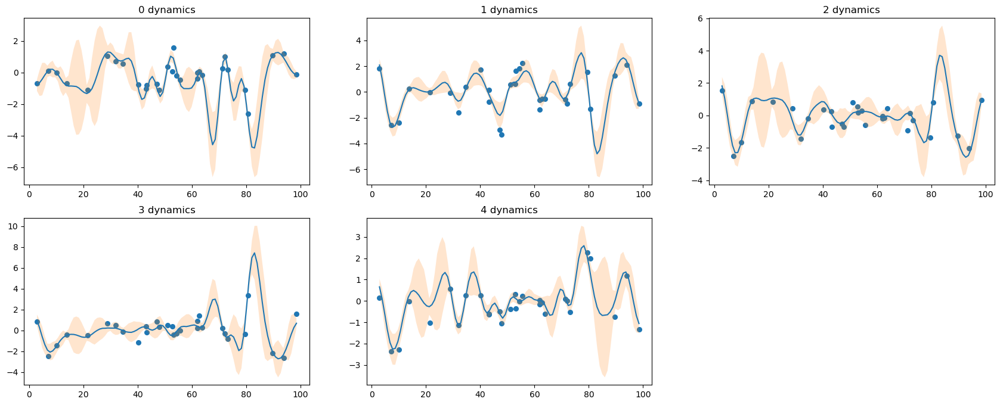

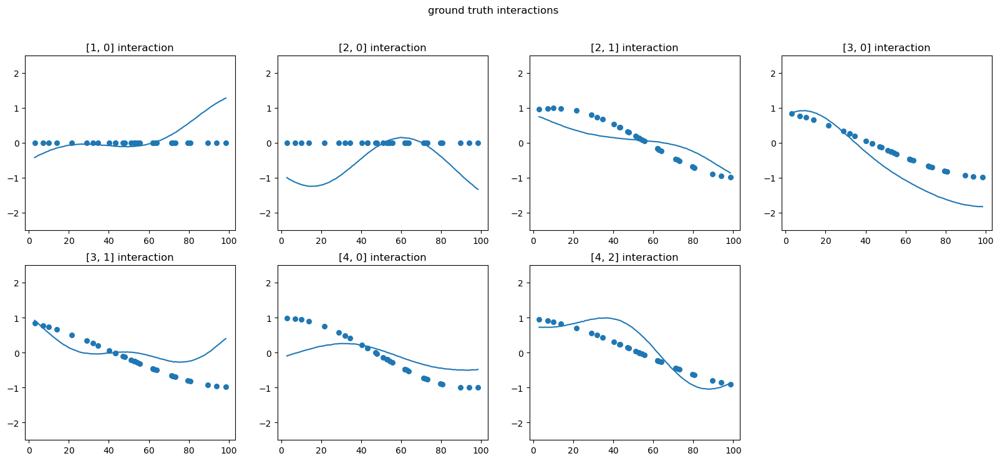

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 508.0403:  24%|████▌              | 24095/100000 [00:33<01:46, 712.12it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 24096, loss: 469.7357


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 62.72it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


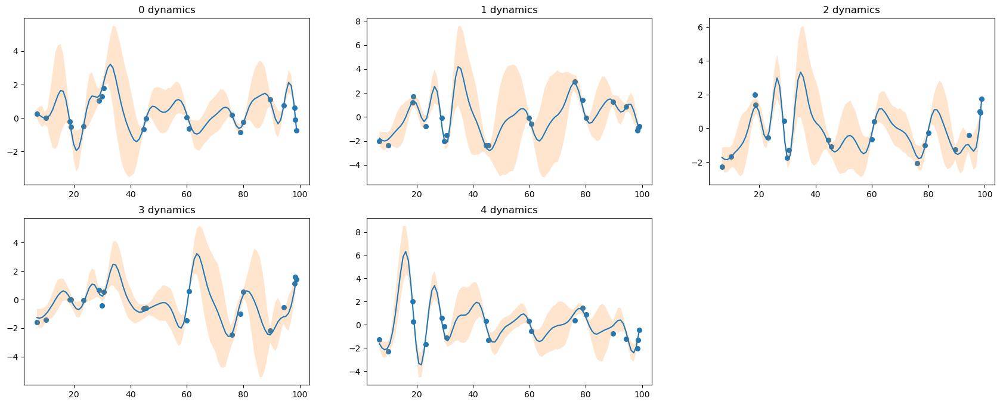

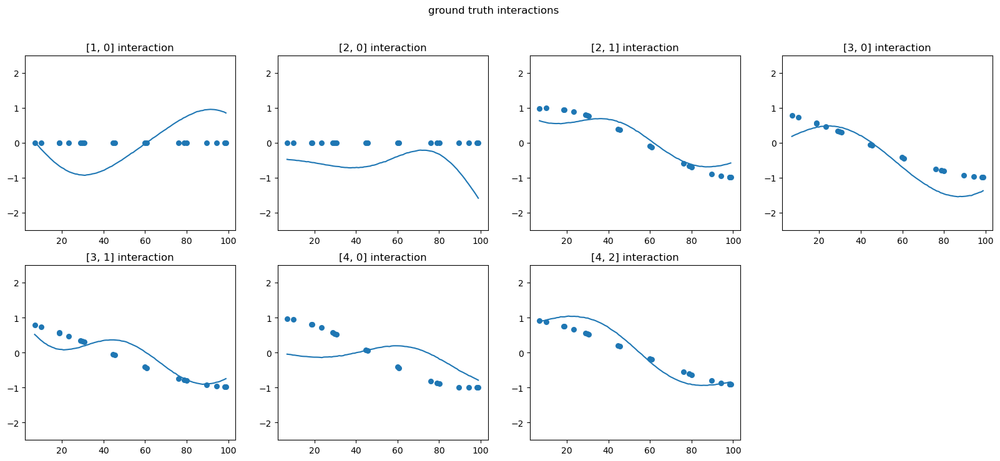

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 1--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 598.6600:  18%|███▍               | 17895/100000 [00:24<01:52, 728.54it/s]


Early stopping at iteration 17896, loss: 592.4766


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.93it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


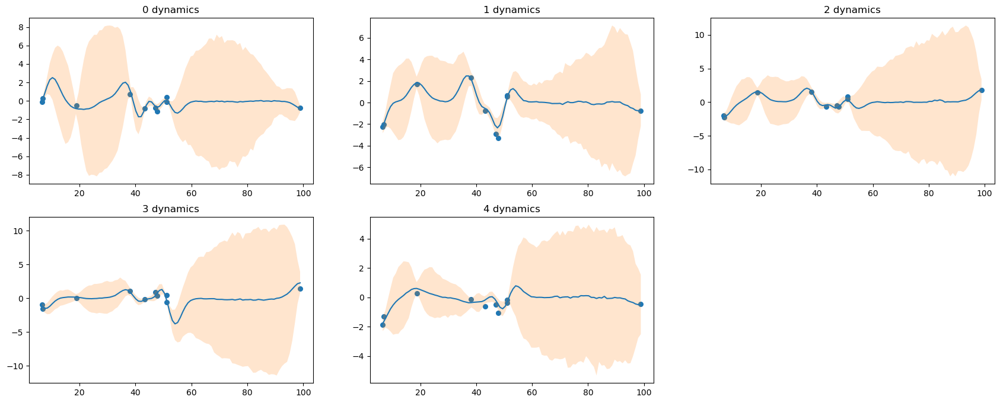

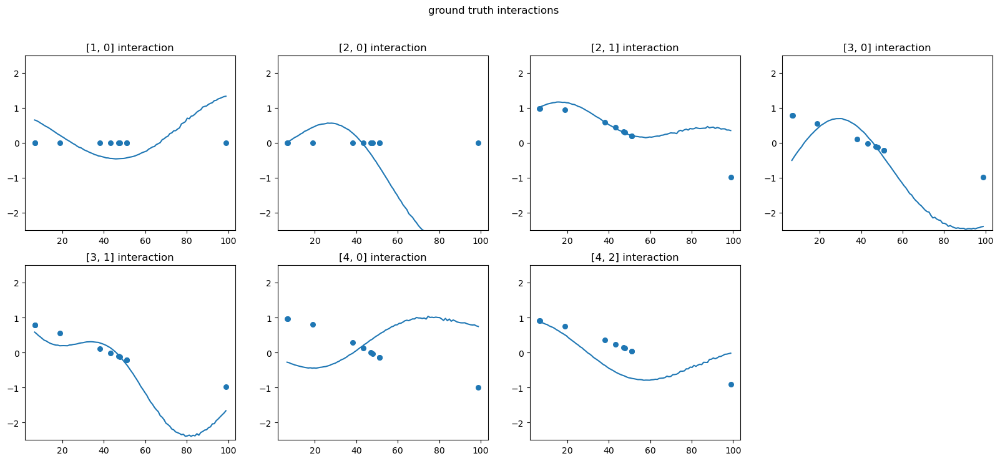

30 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 302.5167:  26%|████▉              | 25789/100000 [00:48<02:20, 529.88it/s]


Early stopping at iteration 25790, loss: 314.0556


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 55.90it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


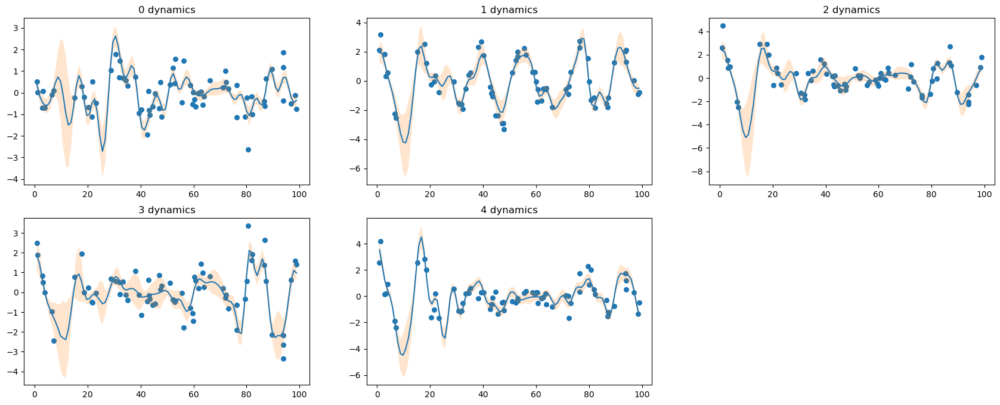

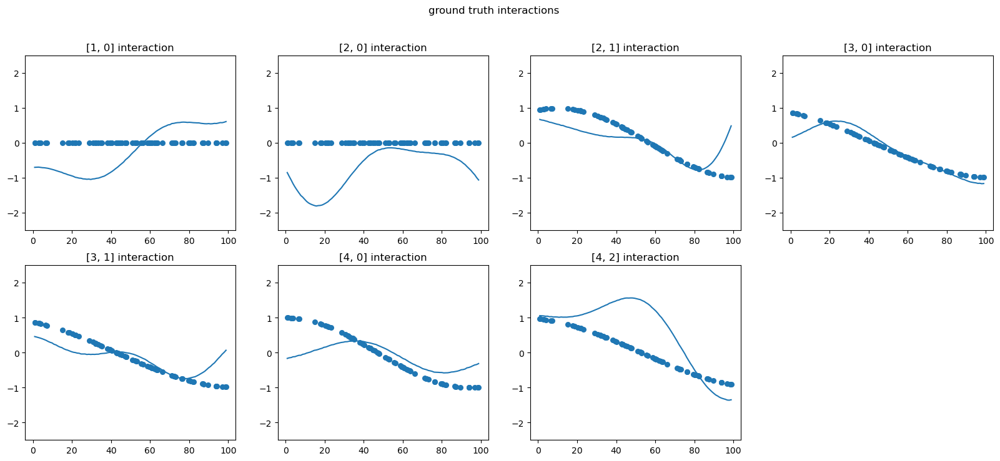

40 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 332.9756:  20%|███▊               | 19759/100000 [00:33<02:17, 583.77it/s]


Early stopping at iteration 19760, loss: 330.5623


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 59.06it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


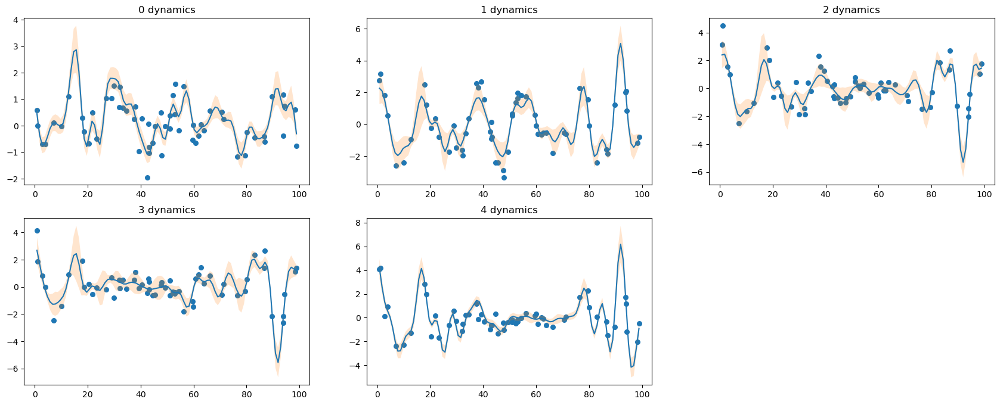

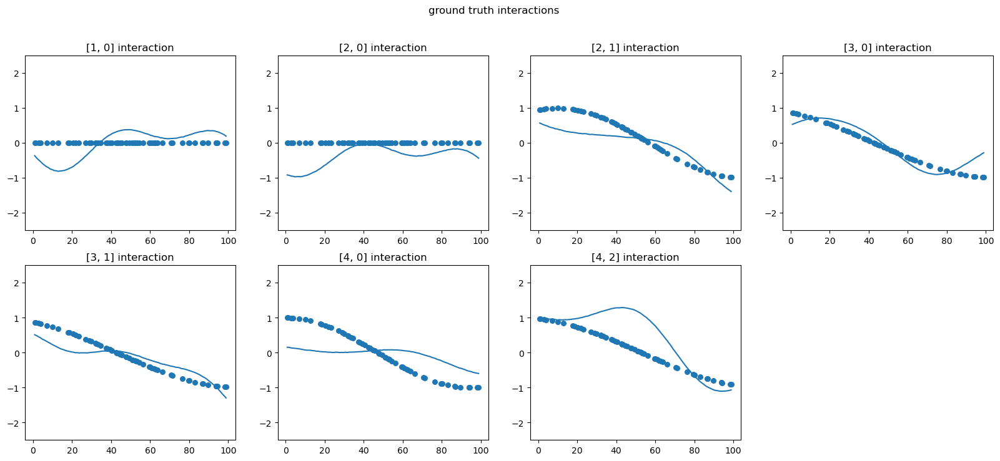

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 435.1115:  18%|███▍               | 18378/100000 [00:28<02:06, 645.40it/s]


Early stopping at iteration 18379, loss: 385.2676


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 65.68it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


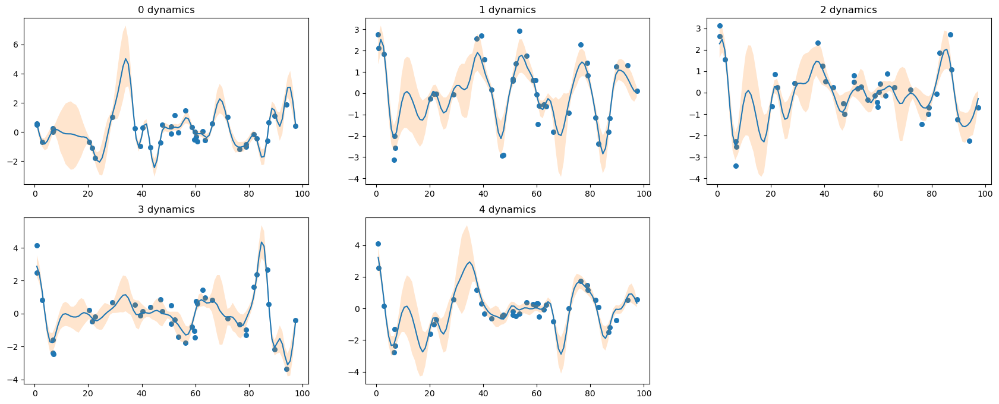

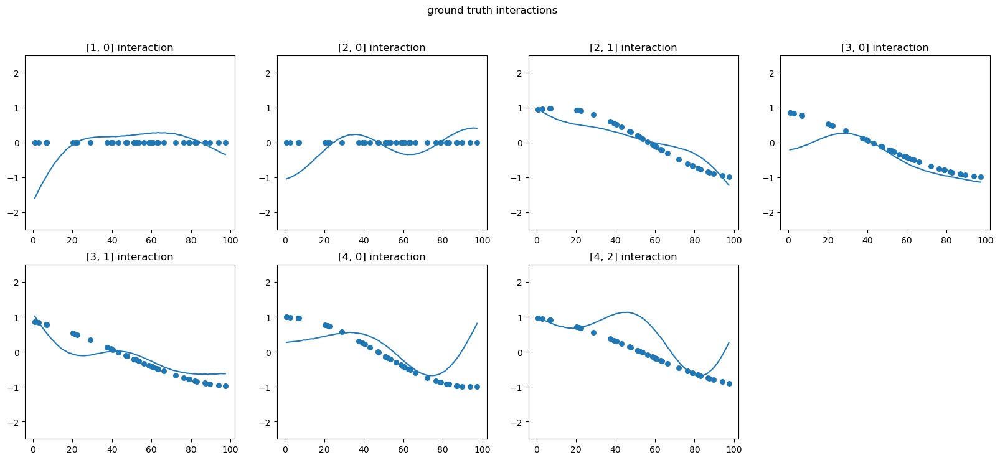

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 421.9873:  27%|█████▏             | 27017/100000 [00:39<01:47, 678.94it/s]


Early stopping at iteration 27018, loss: 388.9090


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 68.52it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


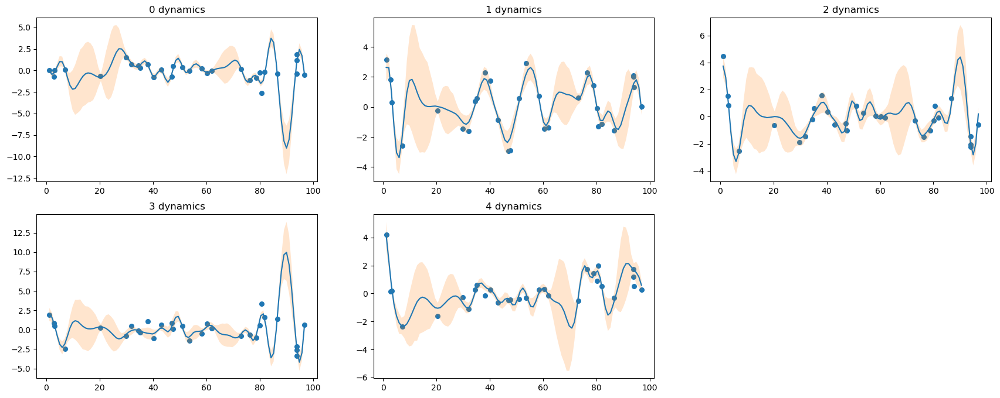

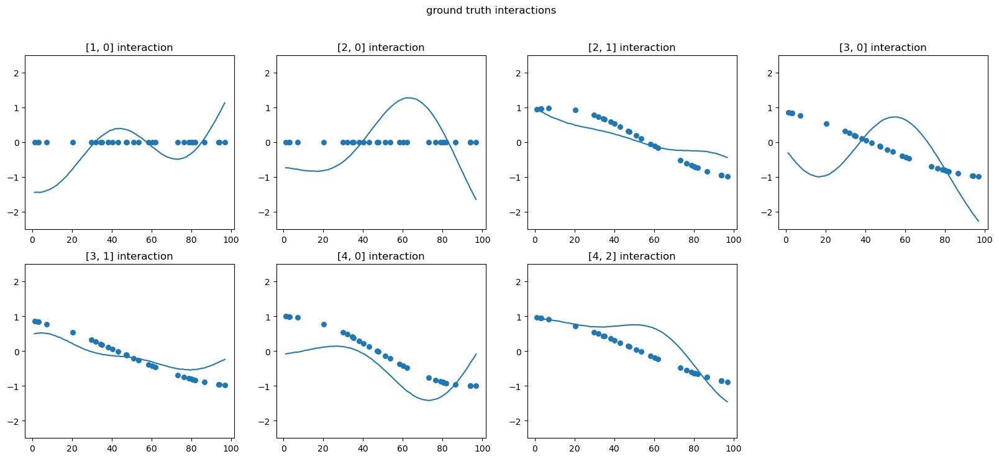

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 391.1401:  20%|███▋               | 19636/100000 [00:27<01:52, 716.30it/s]


Early stopping at iteration 19637, loss: 433.0758


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 62.39it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


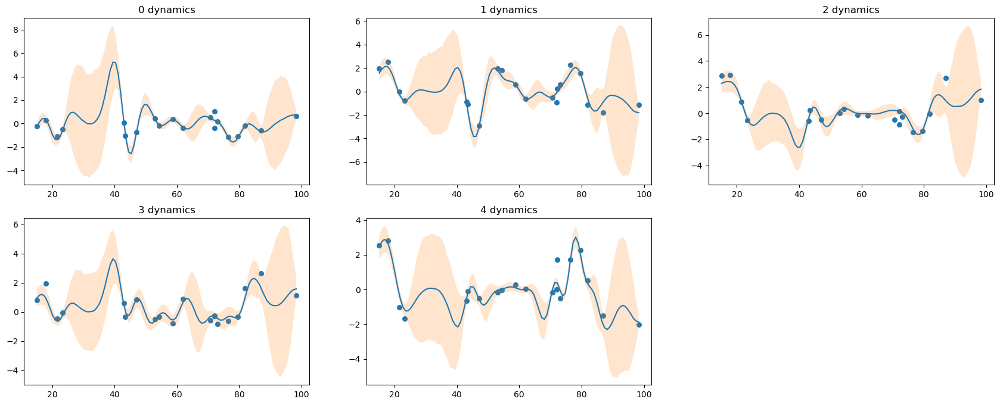

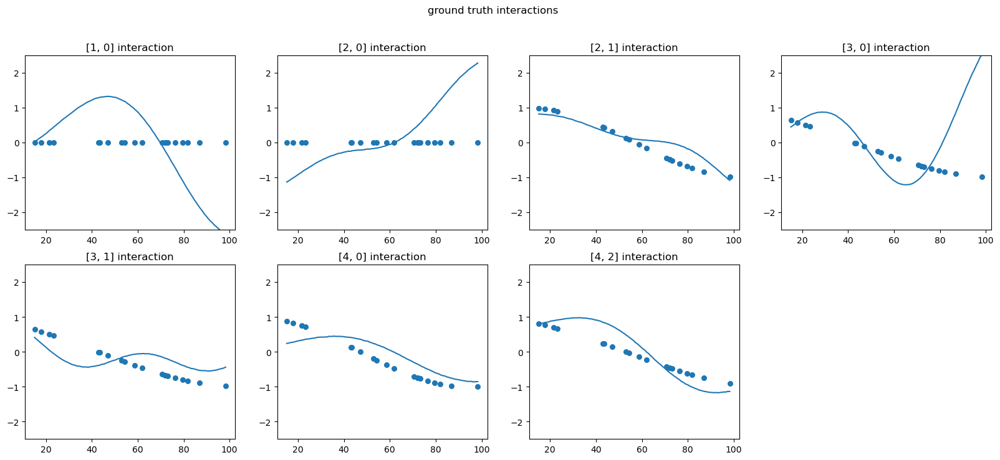

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 2--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 659.4148:  19%|███▌               | 18723/100000 [00:25<01:50, 734.36it/s]


Early stopping at iteration 18724, loss: 729.6108


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 62.53it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


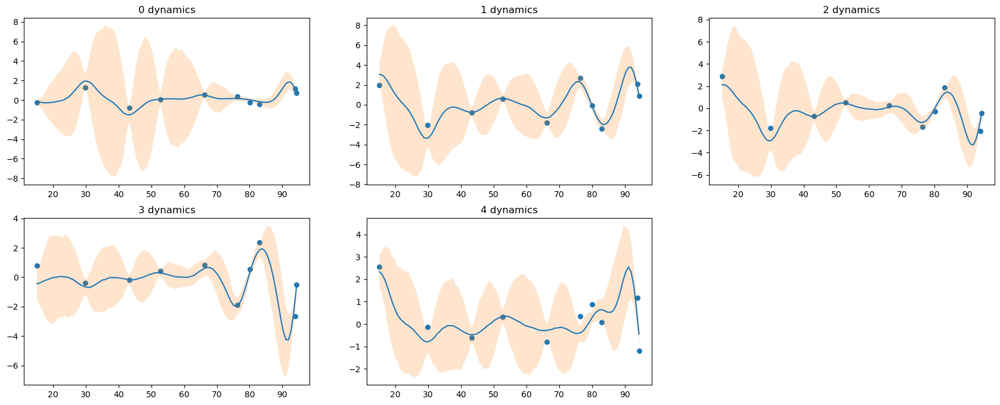

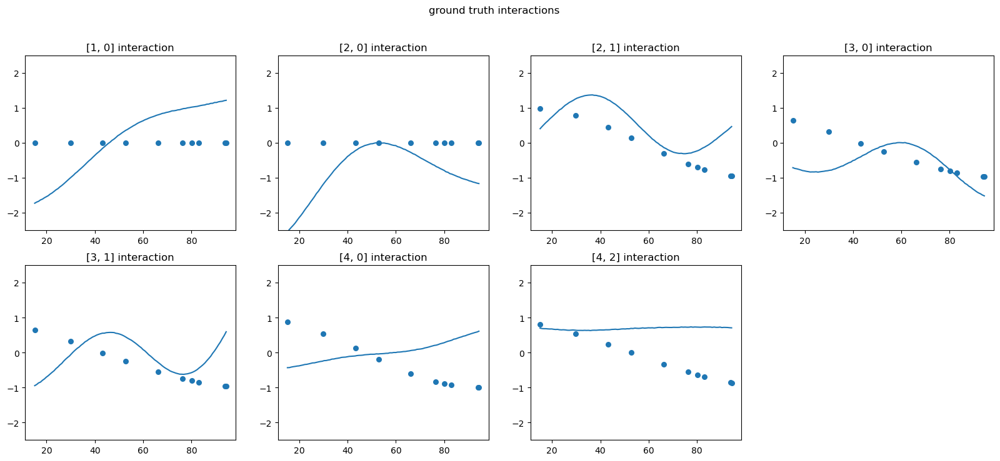

30 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 304.8798:  28%|█████▎             | 27661/100000 [00:53<02:19, 518.51it/s]


Early stopping at iteration 27662, loss: 308.1329


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
100%|███████████████████████████████████████| 1000/1000 [00:18<00:00, 53.43it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


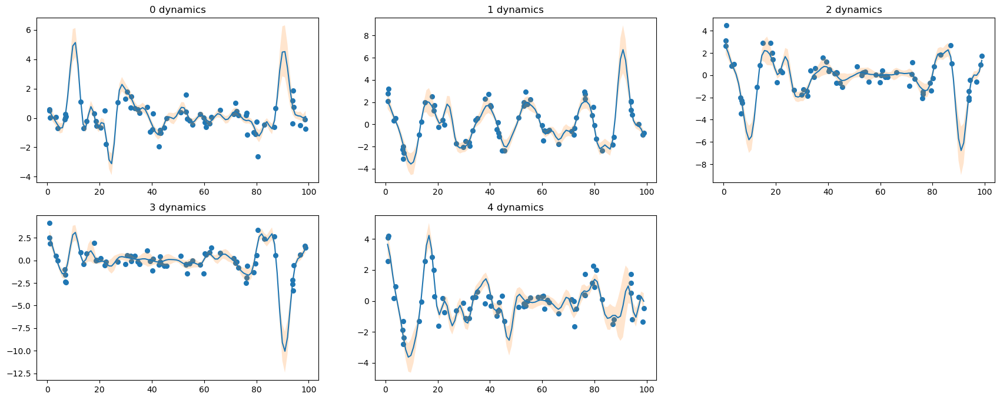

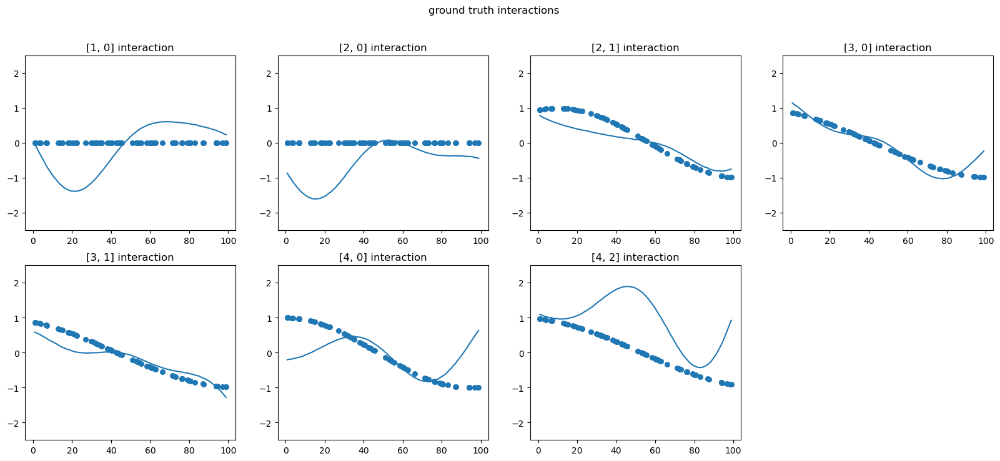

40 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 332.7151:  23%|████▍              | 23449/100000 [00:40<02:11, 583.27it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 23450, loss: 299.0888


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 59.45it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


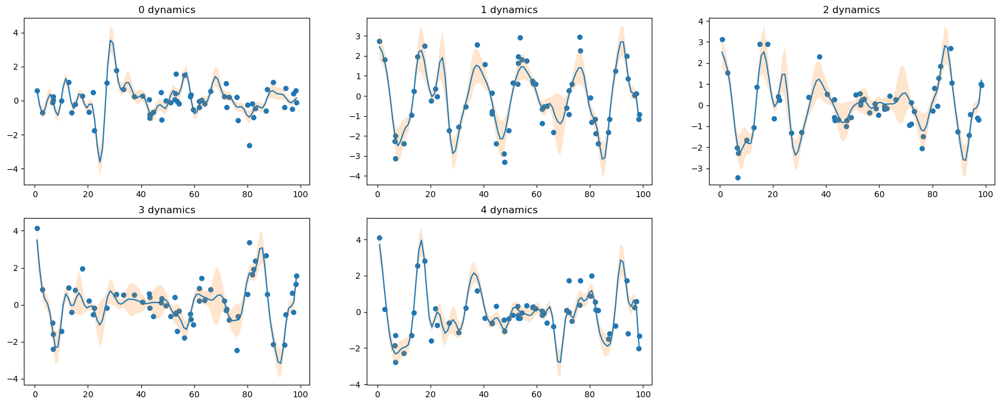

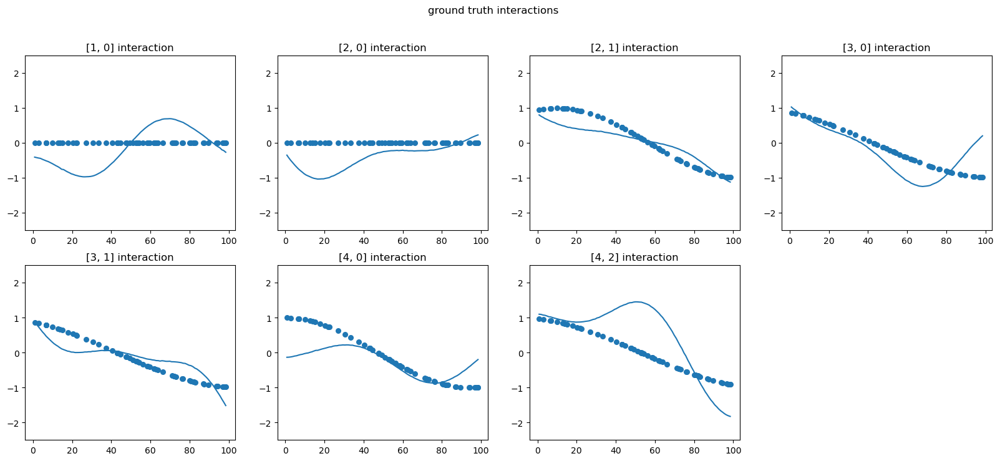

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 319.6588:  27%|█████▏             | 27134/100000 [00:41<01:52, 646.08it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 27135, loss: 320.4245


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 63.26it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


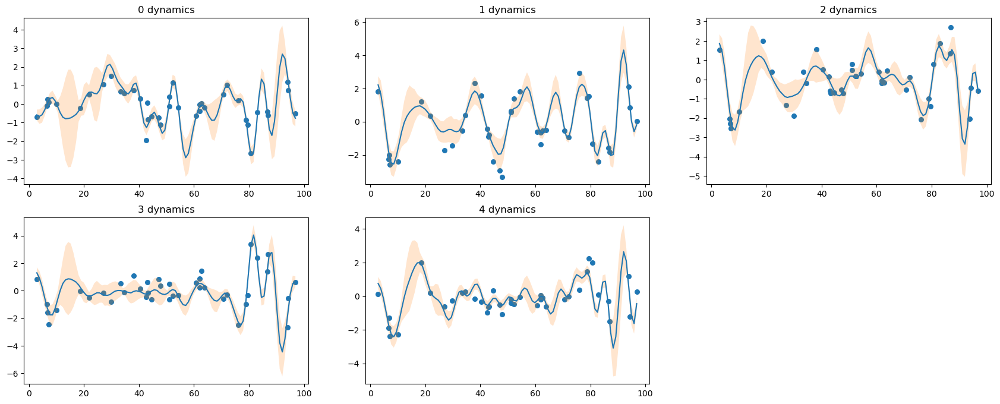

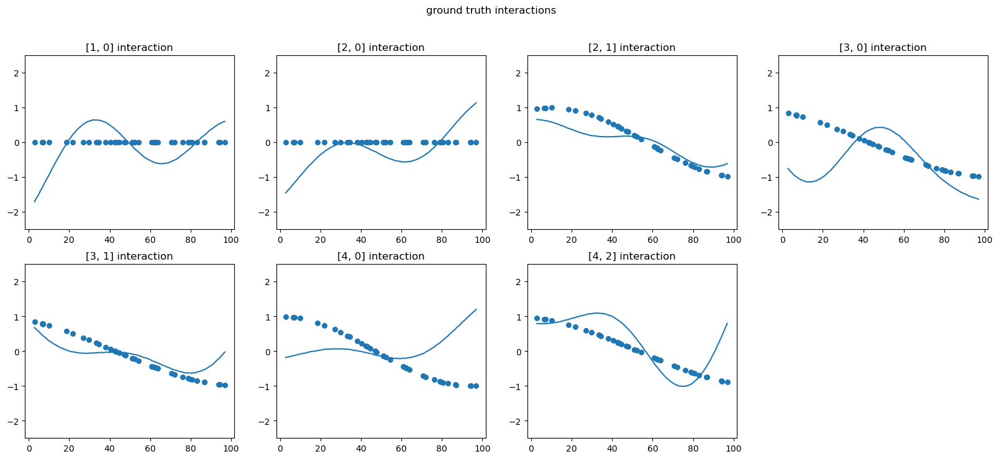

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 403.2749:  18%|███▍               | 17898/100000 [00:26<02:02, 672.81it/s]


Early stopping at iteration 17899, loss: 412.1420


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 68.08it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


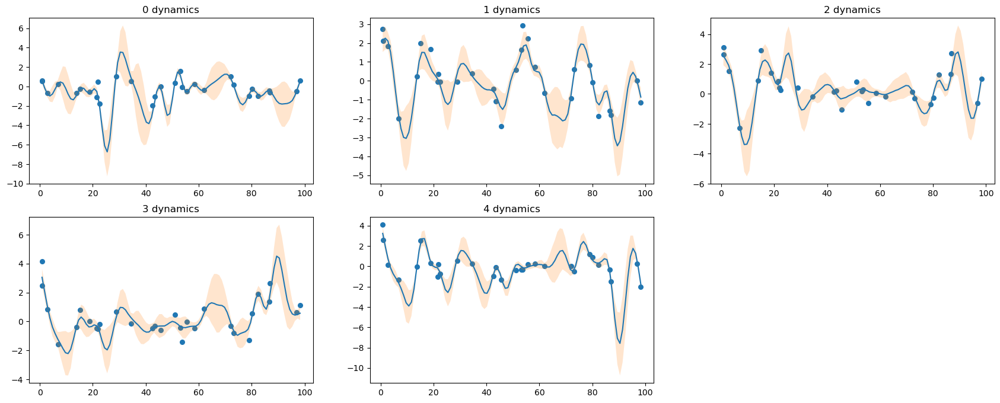

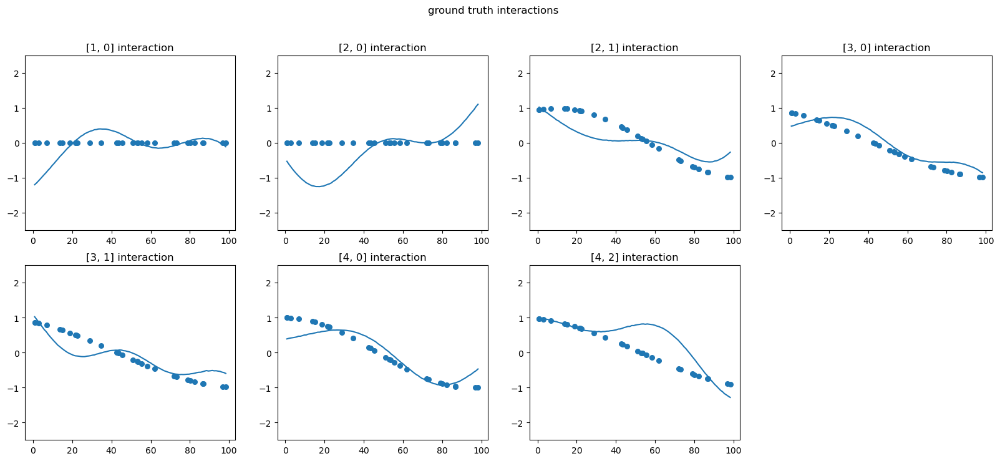

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 393.6918:  15%|██▉                | 15423/100000 [00:21<01:56, 725.87it/s]


Early stopping at iteration 15424, loss: 378.0158


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.31it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


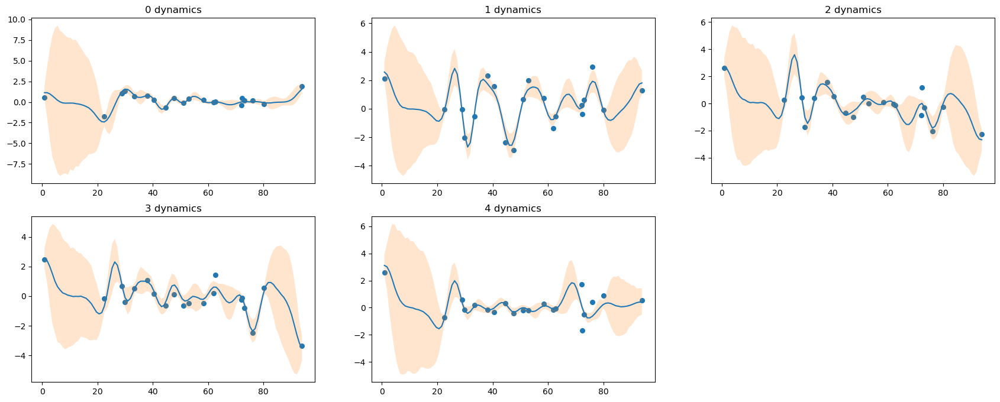

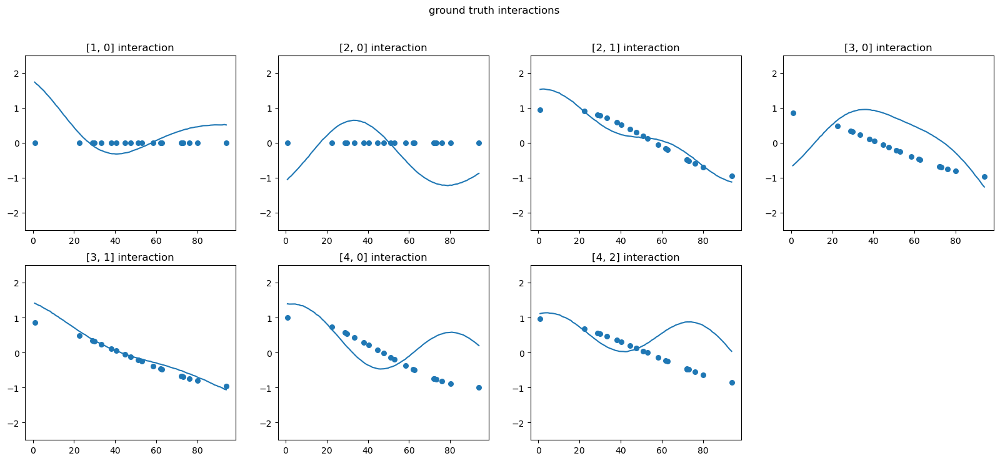

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 3--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 568.8005:  15%|██▊                | 14769/100000 [00:19<01:53, 747.91it/s]


Early stopping at iteration 14770, loss: 630.3317


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 62.44it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


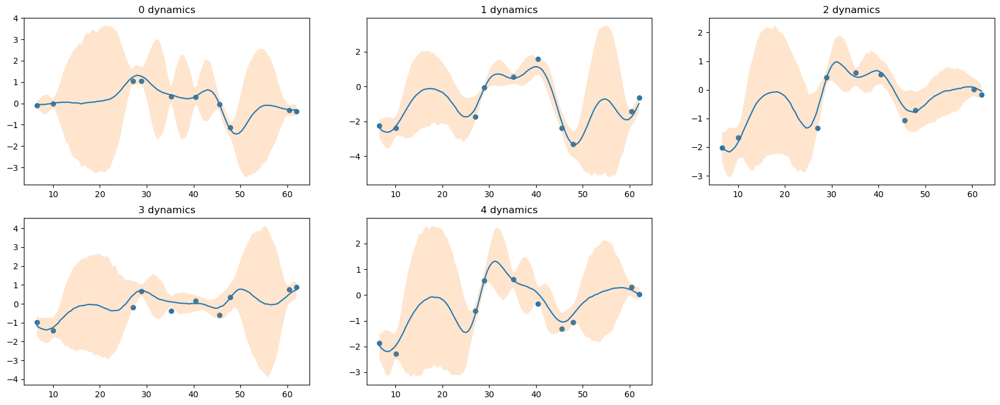

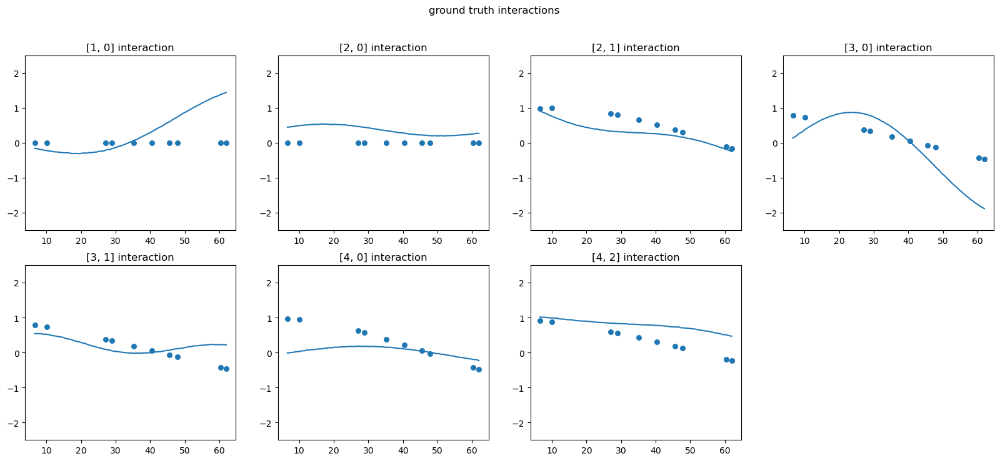

30 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 336.5513:  18%|███▍               | 18391/100000 [00:34<02:35, 526.32it/s]


Early stopping at iteration 18392, loss: 323.5888


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 57.74it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


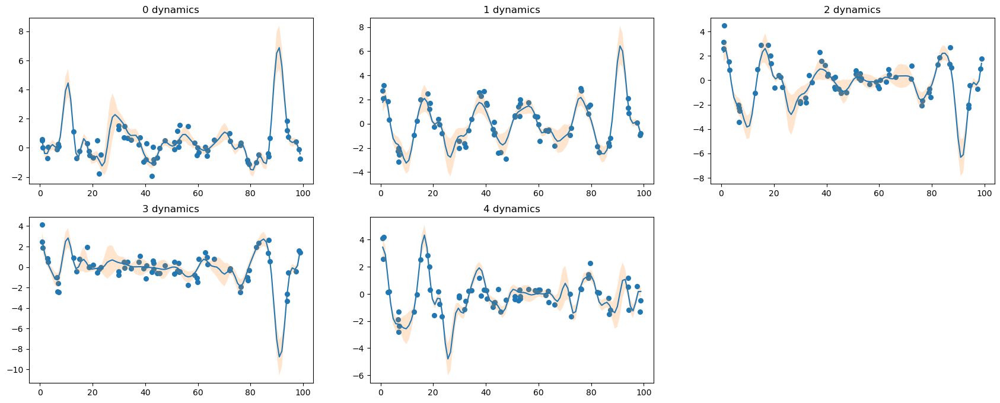

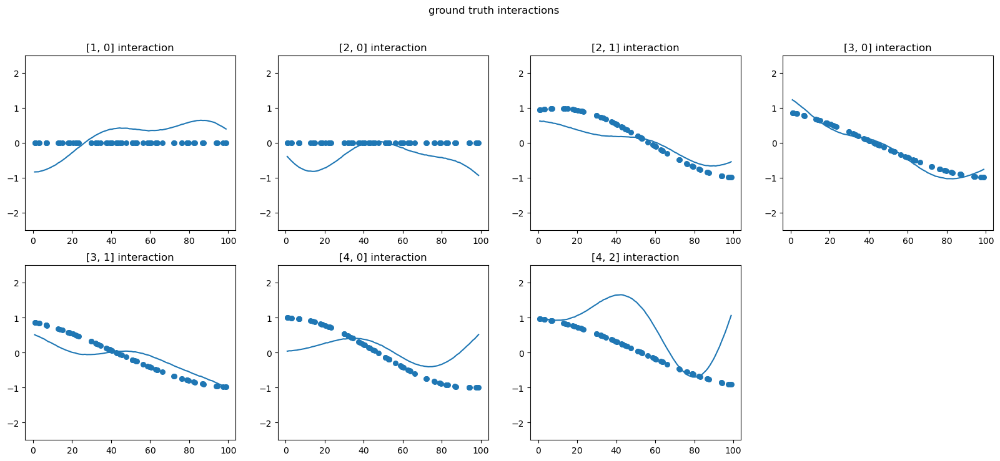

40 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 330.3141:  25%|████▋              | 24906/100000 [00:41<02:05, 596.95it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 24907, loss: 343.4642


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 62.36it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


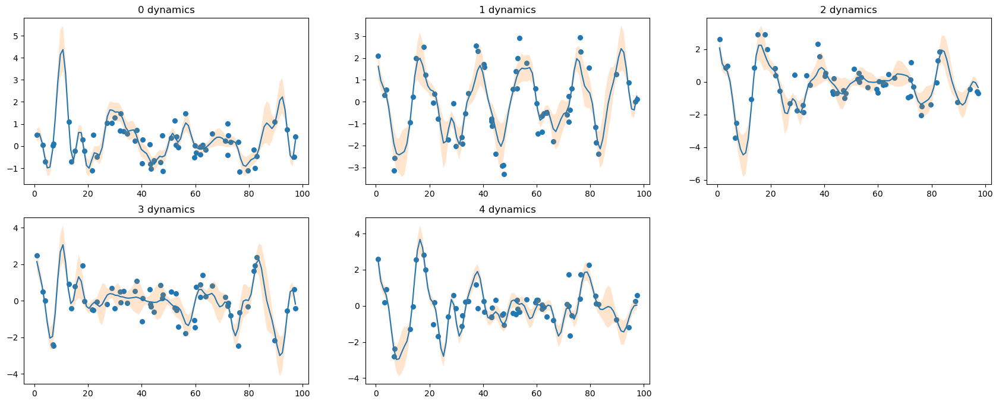

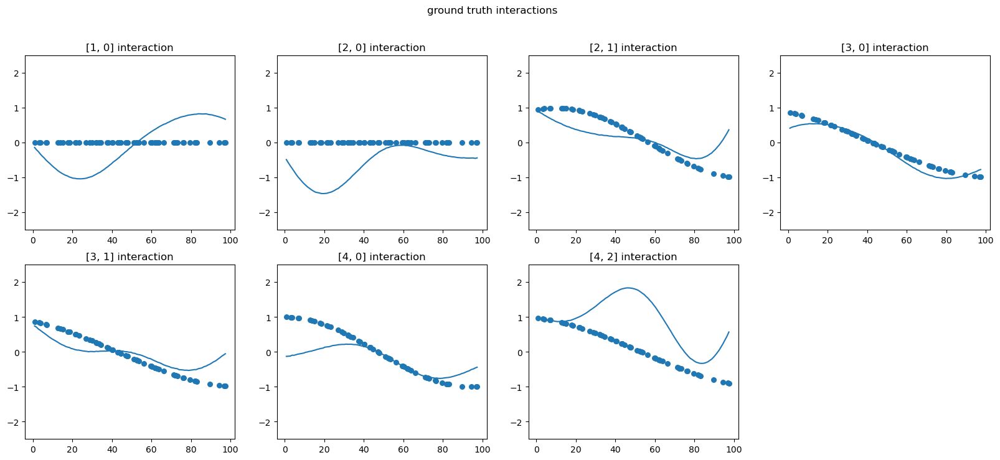

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 367.9029:  21%|████               | 21275/100000 [00:32<01:59, 659.83it/s]


Early stopping at iteration 21276, loss: 346.1176


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.19it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


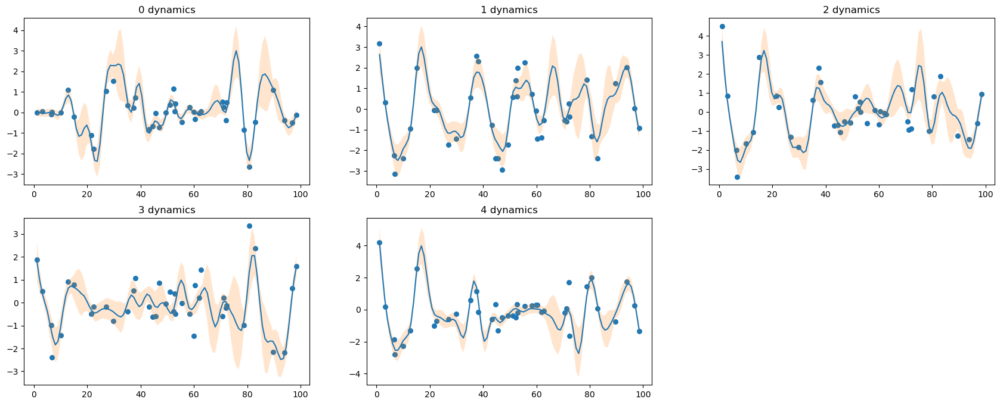

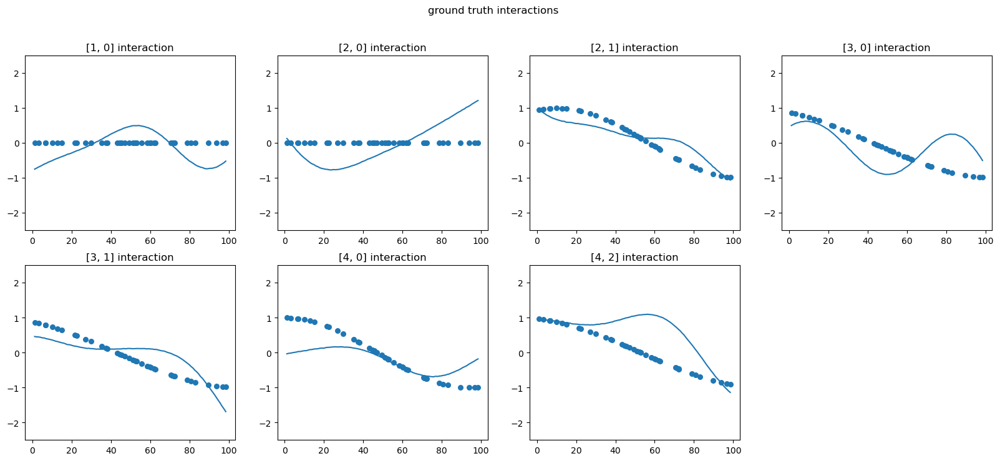

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 387.0677:  19%|███▋               | 19493/100000 [00:28<01:57, 685.91it/s]


Early stopping at iteration 19494, loss: 396.9983


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 69.68it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


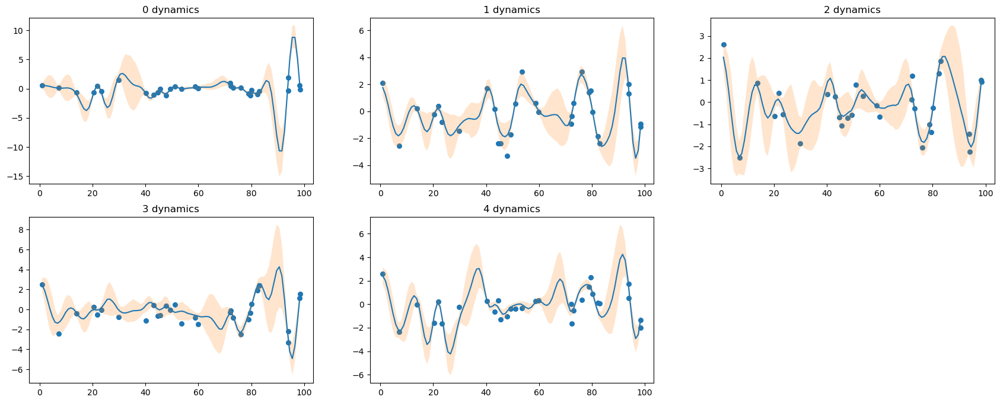

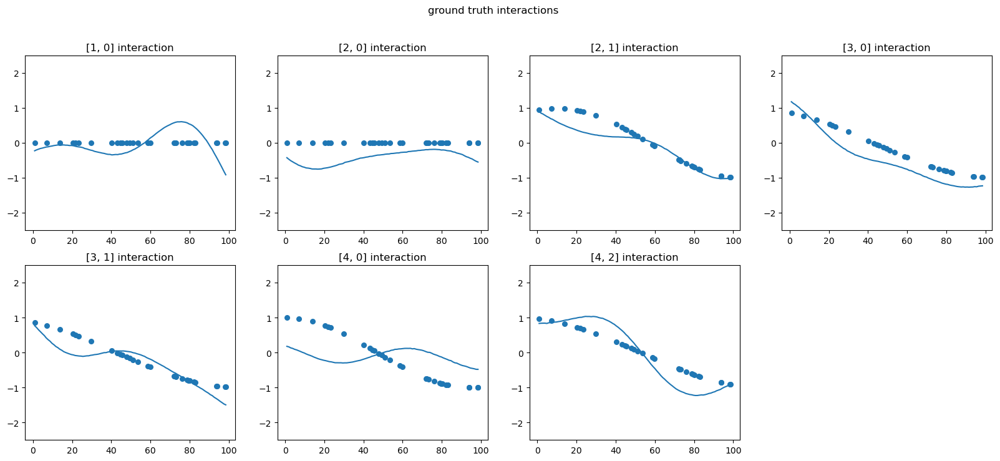

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 487.6438:  17%|███▎               | 17285/100000 [00:23<01:53, 726.58it/s]


Early stopping at iteration 17286, loss: 526.1526


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.80it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


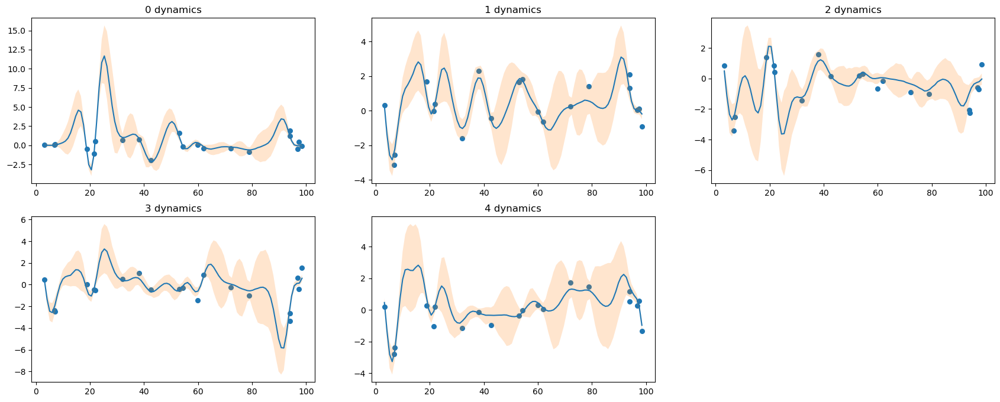

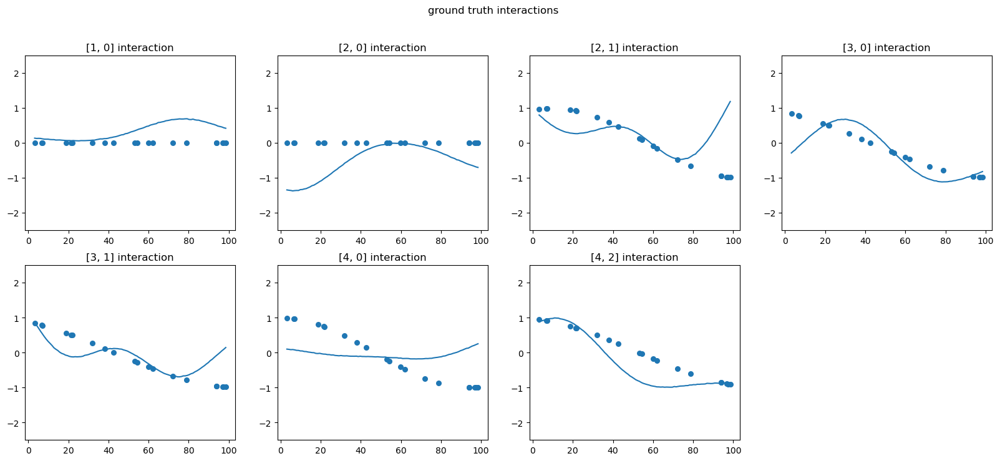

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 4--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 622.5957:  32%|██████             | 31860/100000 [00:42<01:31, 747.60it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 31861, loss: 573.7938


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.55it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


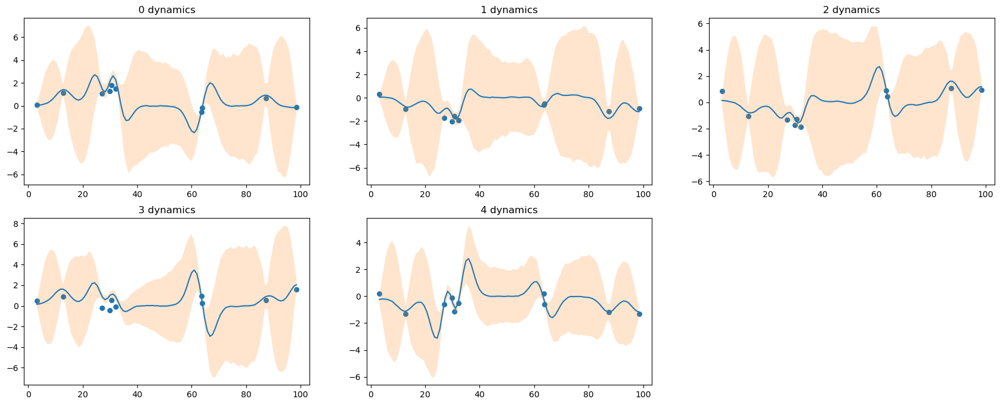

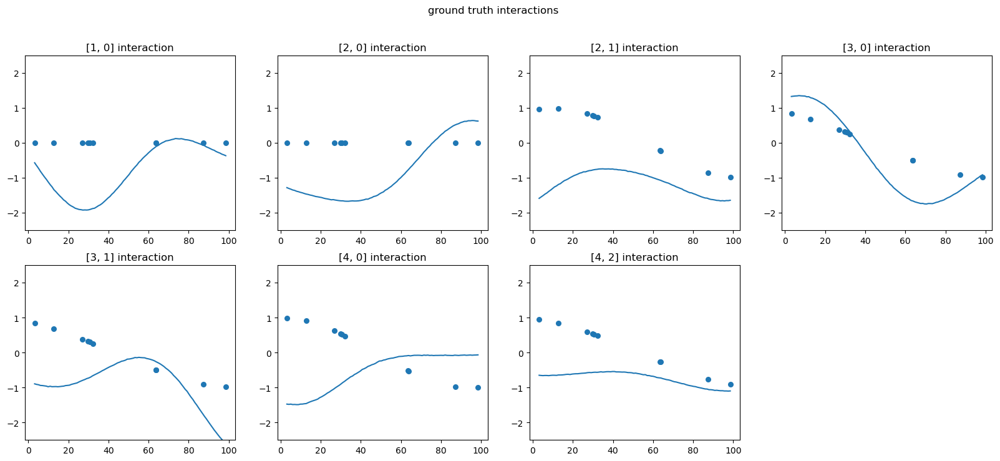

30 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 324.8227:  17%|███▏               | 16930/100000 [00:32<02:37, 526.79it/s]


Early stopping at iteration 16931, loss: 327.1534


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.81it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


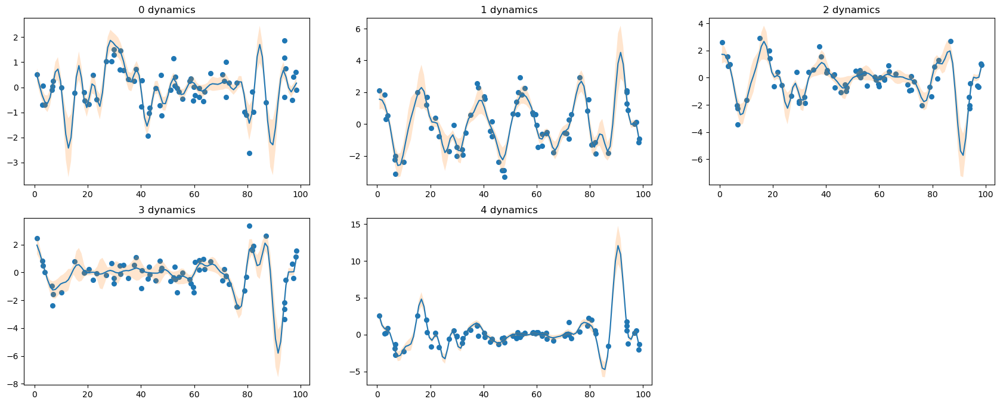

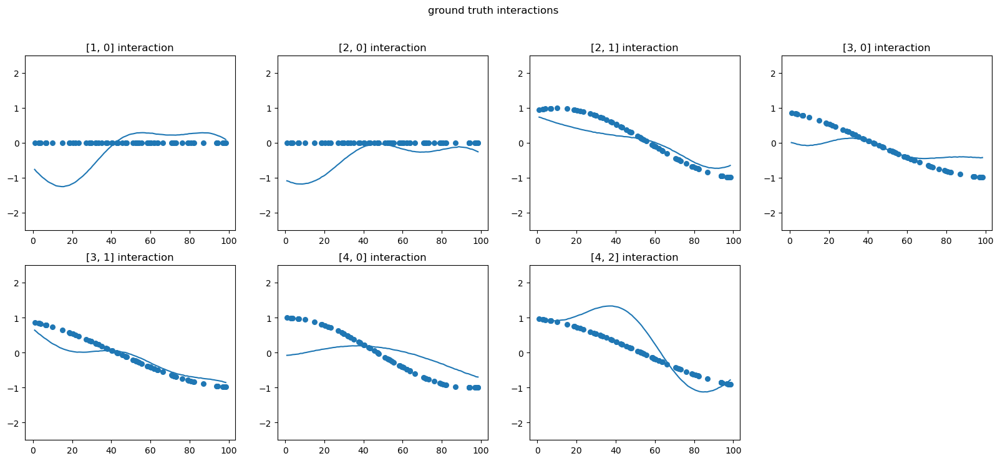

40 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 319.4059:  36%|██████▊            | 35756/100000 [00:59<01:47, 597.37it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 35757, loss: 308.4236


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 61.31it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


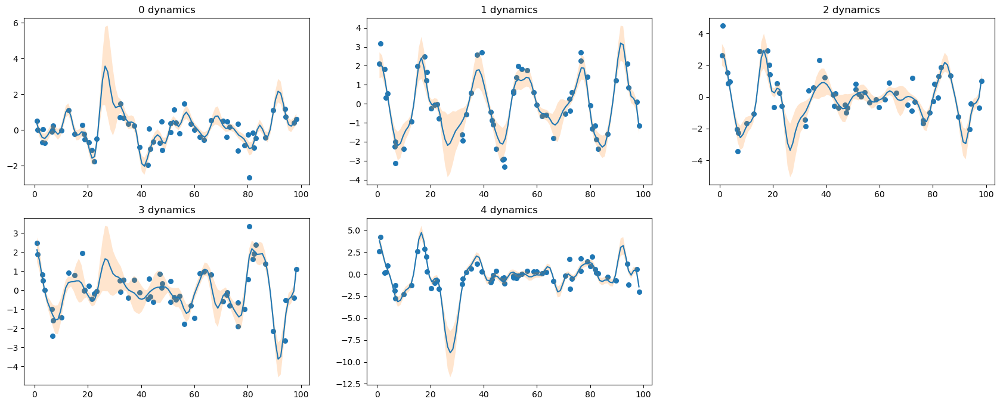

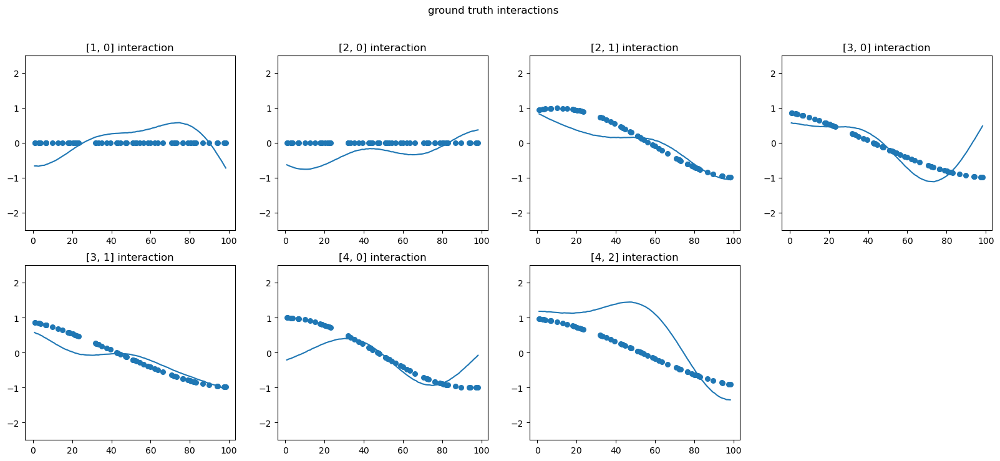

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 368.0789:  14%|██▋                | 14137/100000 [00:21<02:10, 655.91it/s]


Early stopping at iteration 14138, loss: 377.2540


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.10it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


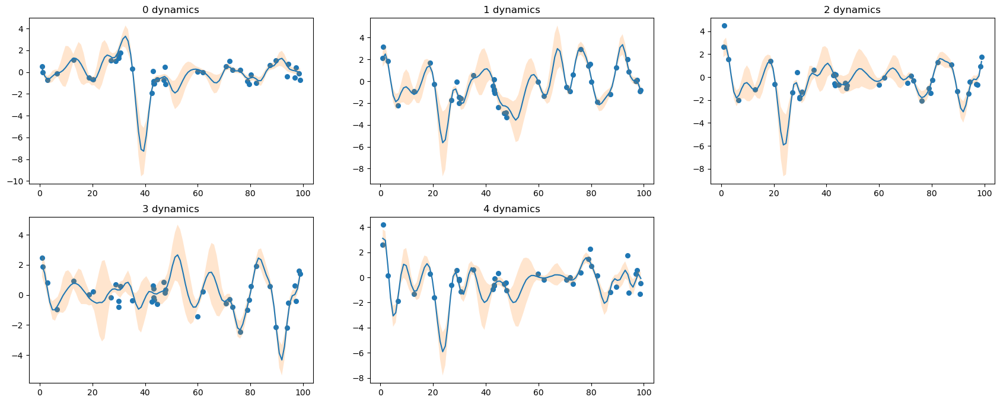

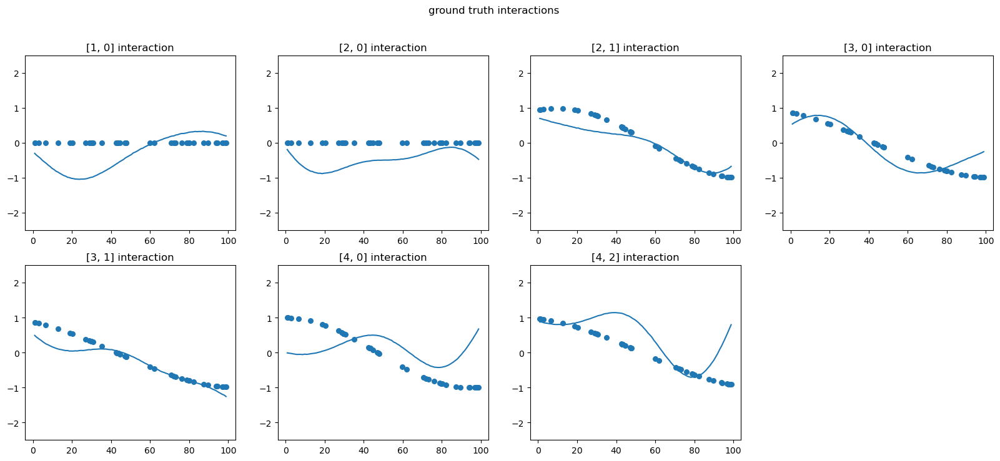

70 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 420.7099:  20%|███▊               | 19864/100000 [00:28<01:56, 687.10it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 19865, loss: 380.7194


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 68.20it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


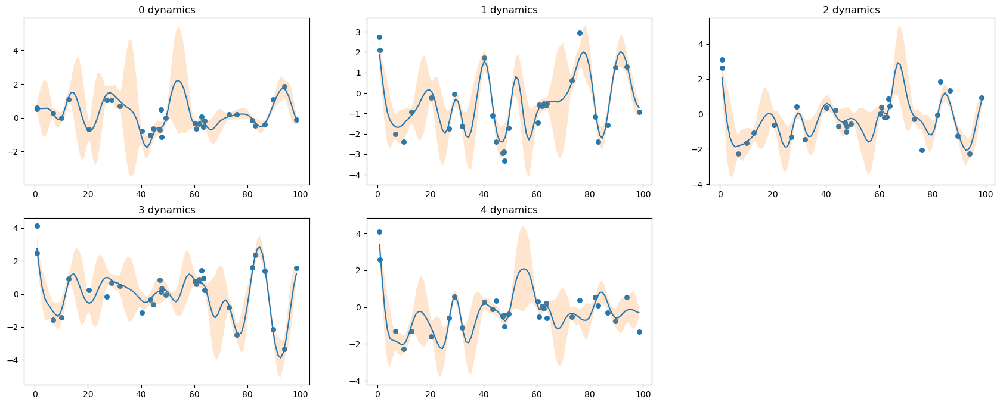

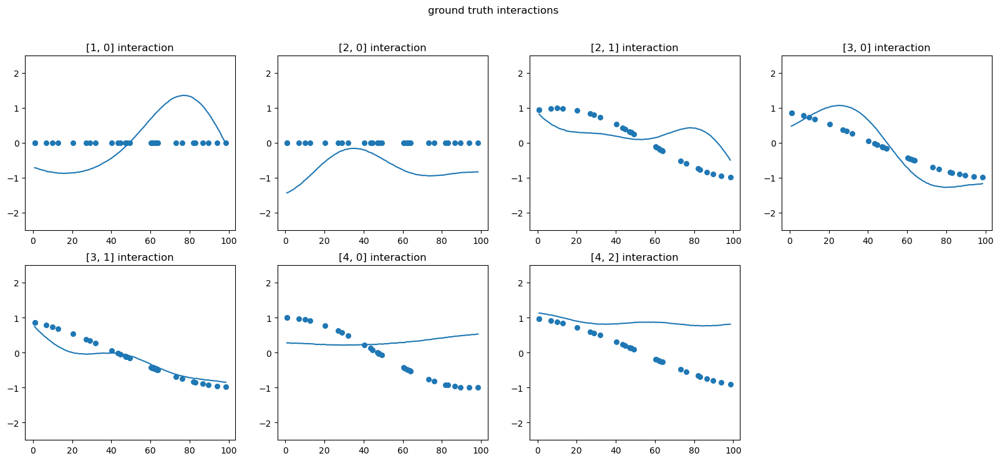

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 554.7546:  20%|███▊               | 20139/100000 [00:27<01:50, 722.69it/s]


Early stopping at iteration 20140, loss: 594.4296


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 62.23it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


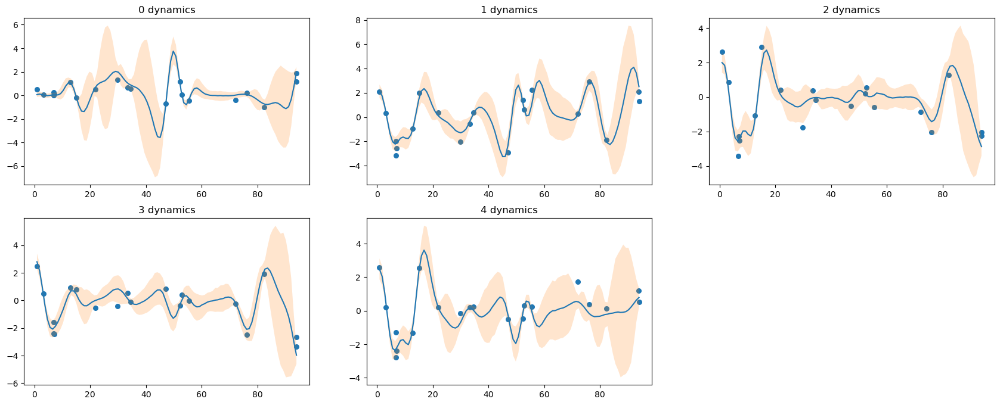

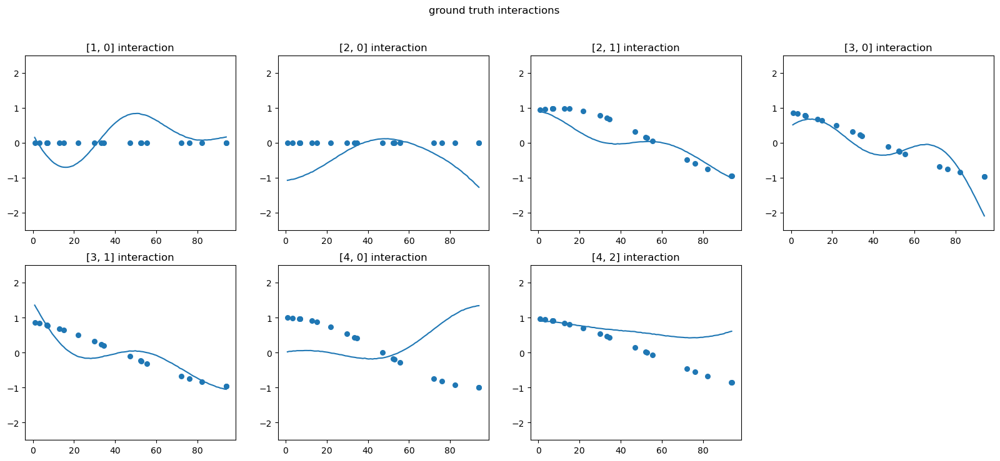

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 5--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 517.3143:  19%|███▌               | 18924/100000 [00:25<01:49, 739.55it/s]


Early stopping at iteration 18925, loss: 586.7584


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.22it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


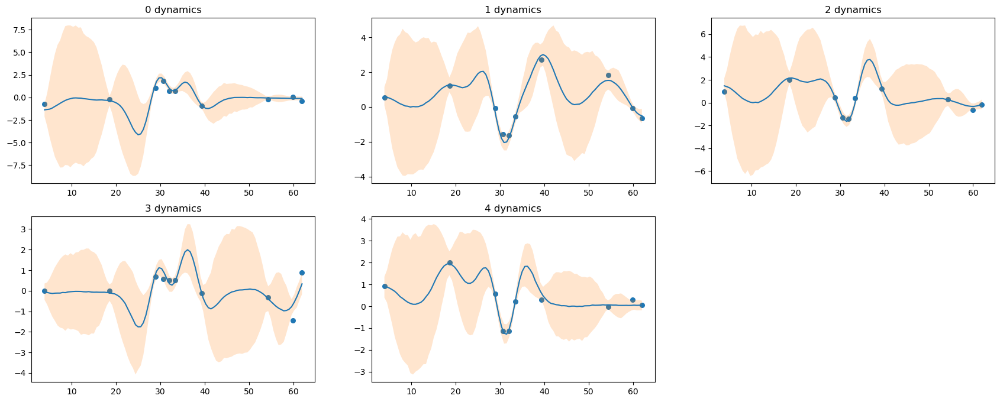

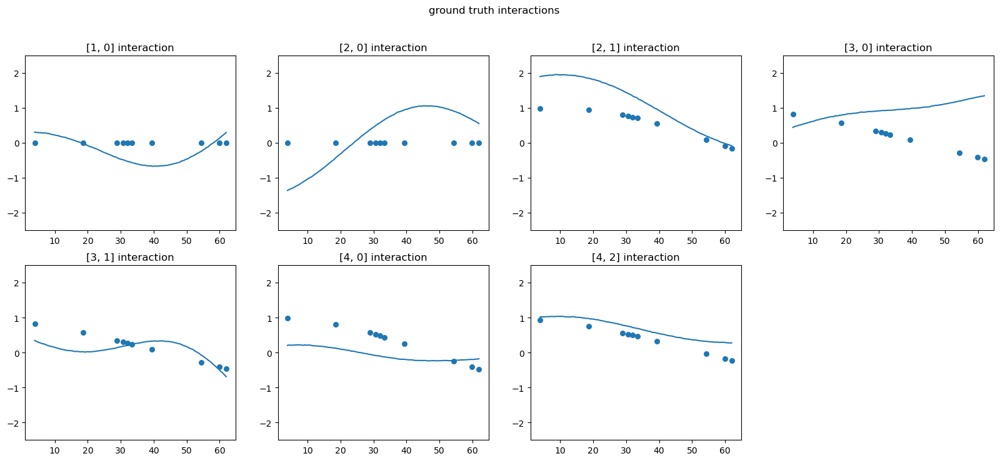

30 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 285.3637:  41%|███████▊           | 40951/100000 [01:20<01:56, 506.44it/s]


Early stopping at iteration 40952, loss: 281.6261


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
100%|███████████████████████████████████████| 1000/1000 [00:18<00:00, 52.65it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


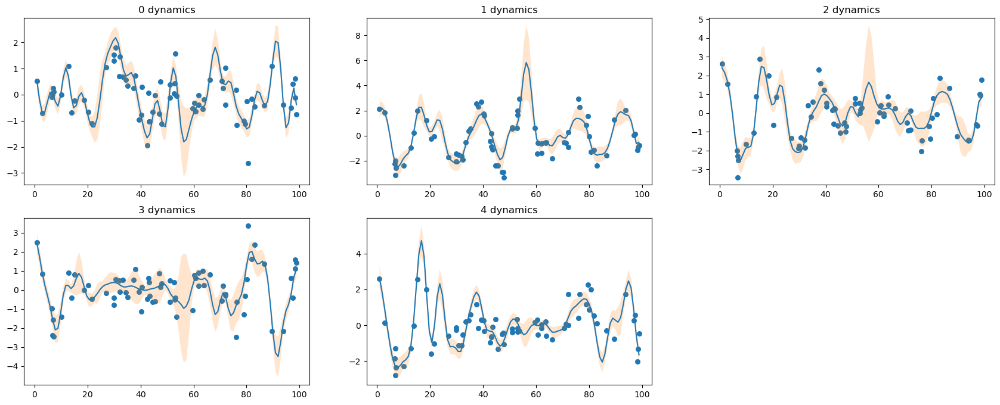

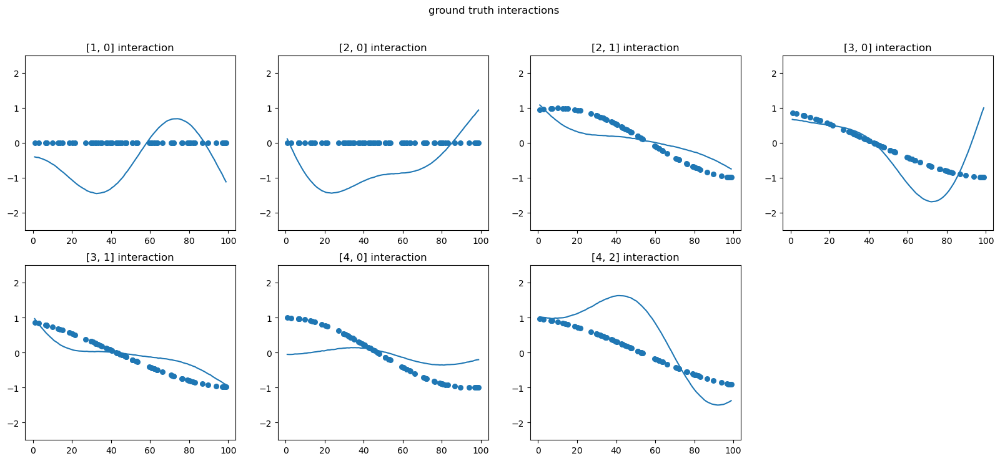

40 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 338.2561:  27%|█████              | 26747/100000 [00:46<02:07, 576.35it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 26748, loss: 307.8451


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.30it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


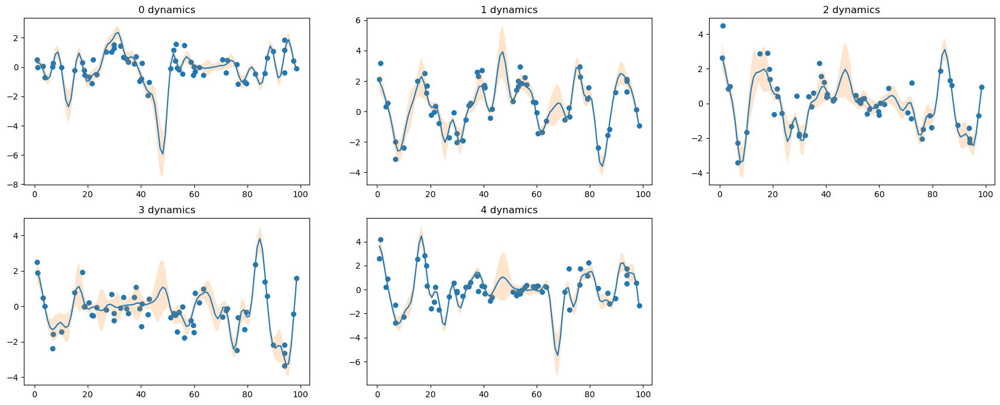

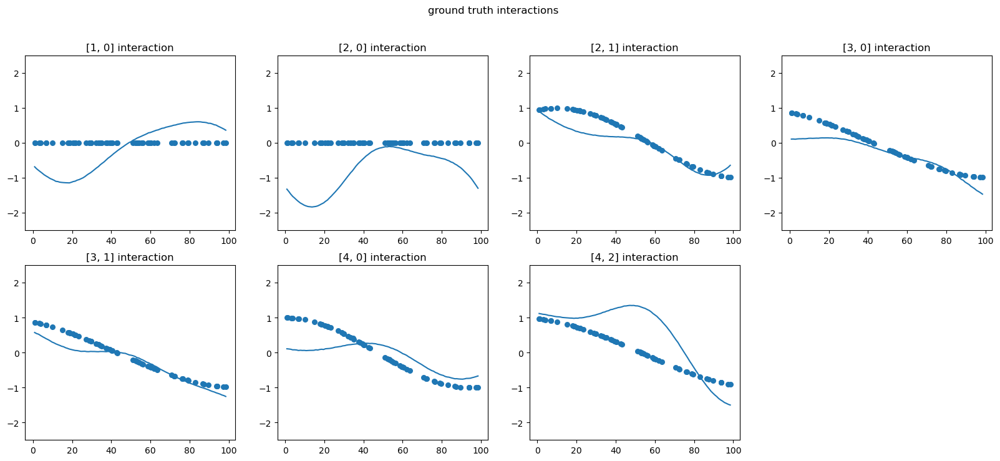

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 329.7189:  18%|███▍               | 18049/100000 [00:28<02:07, 642.91it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 18050, loss: 357.6117


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.21it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


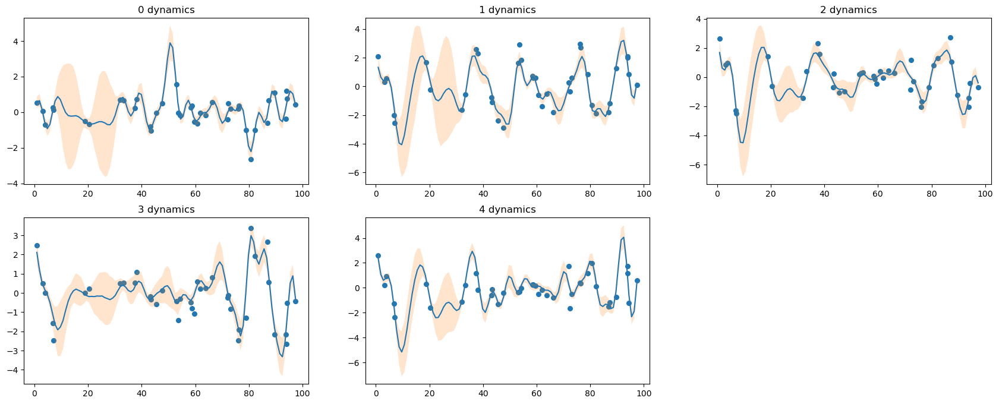

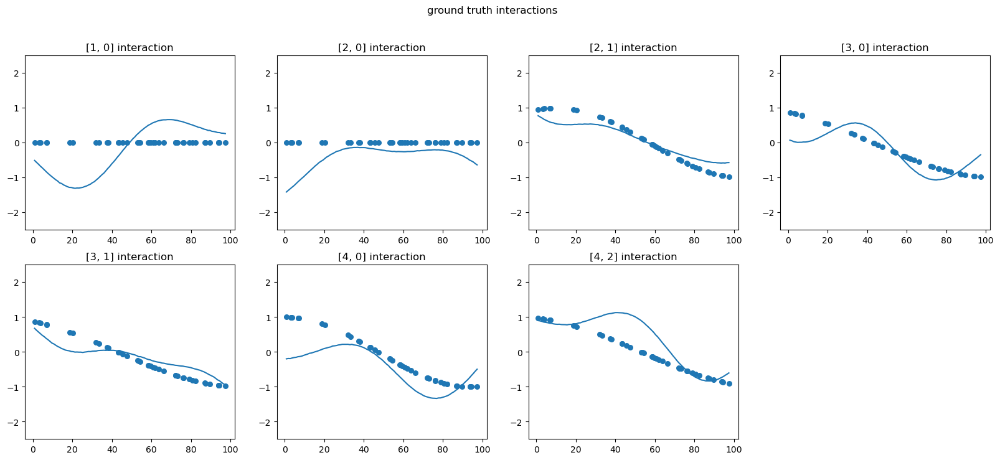

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 403.7807:  19%|███▋               | 19162/100000 [00:28<02:01, 664.90it/s]


Early stopping at iteration 19163, loss: 408.6114


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.23it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


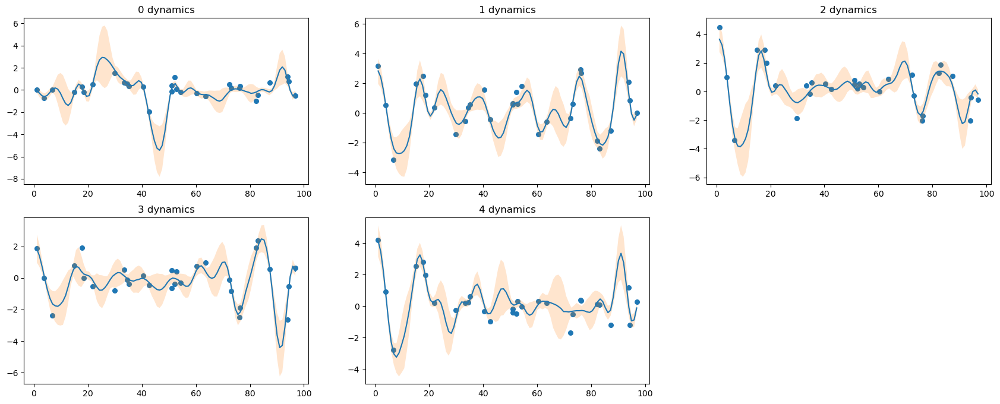

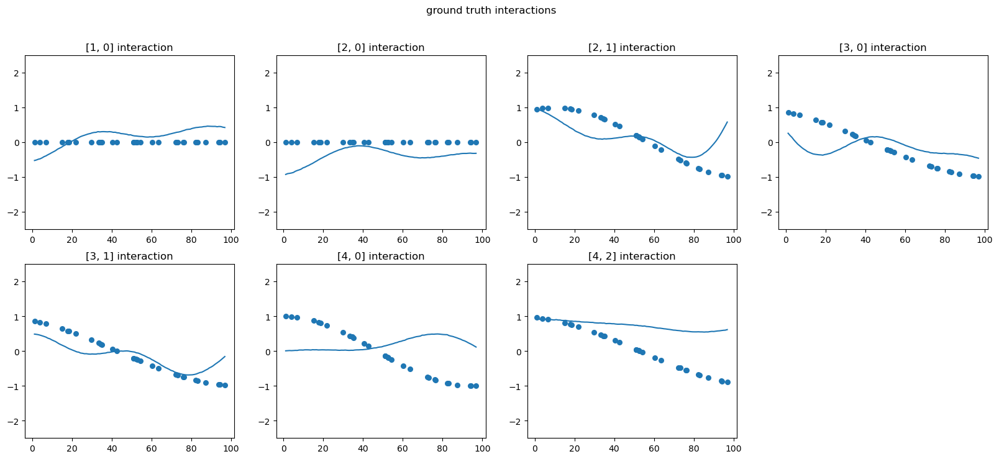

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 484.9040:  13%|██▌                | 13171/100000 [00:18<02:02, 711.02it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 13172, loss: 442.3403


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 61.79it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


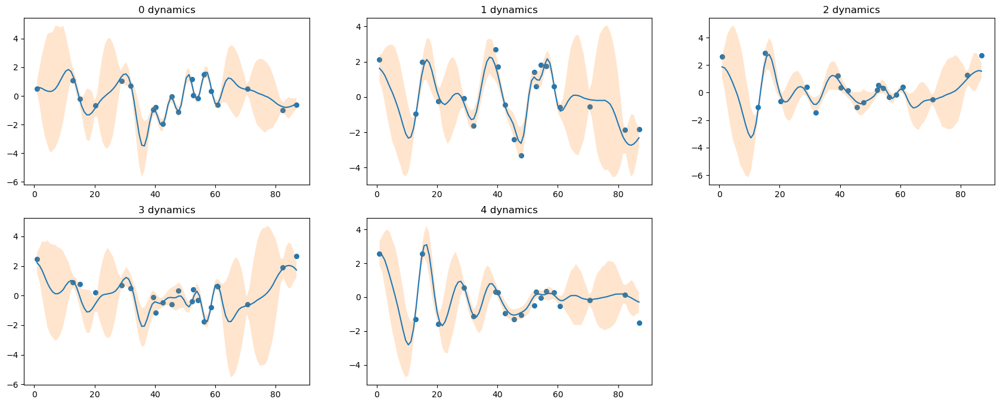

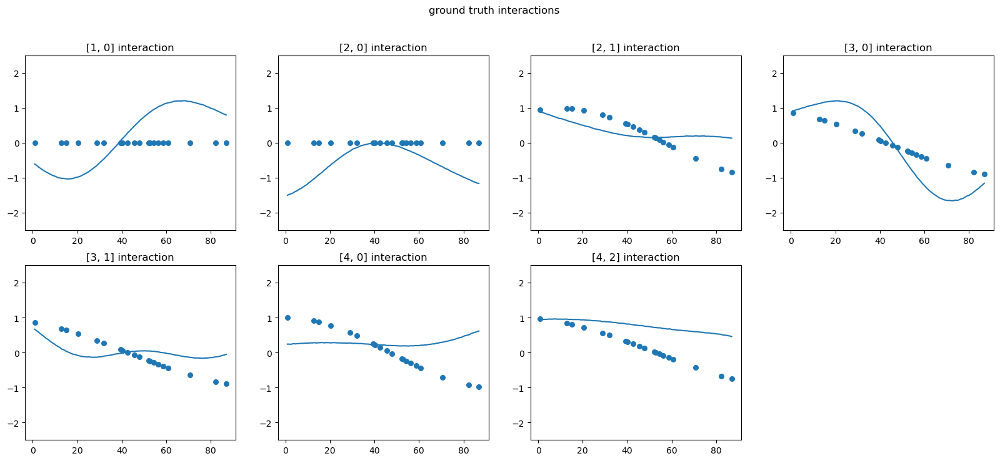

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 6--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 778.9505:  34%|██████▌            | 34262/100000 [00:46<01:29, 731.08it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 34263, loss: 706.2459


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 59.15it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


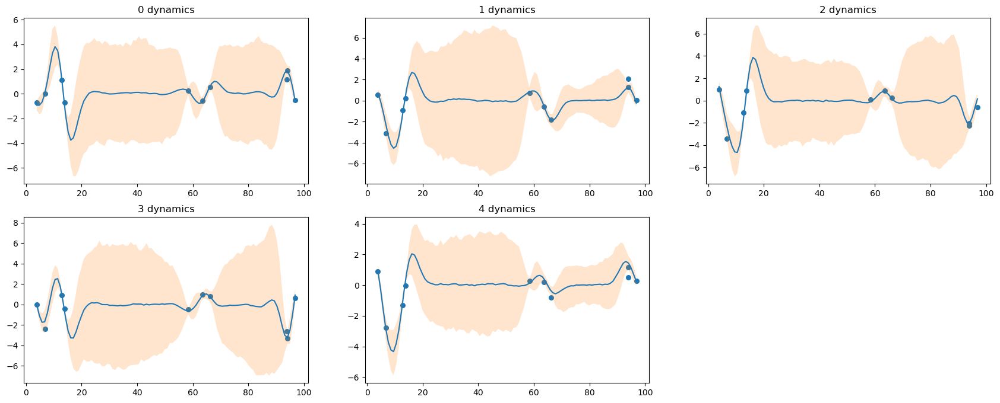

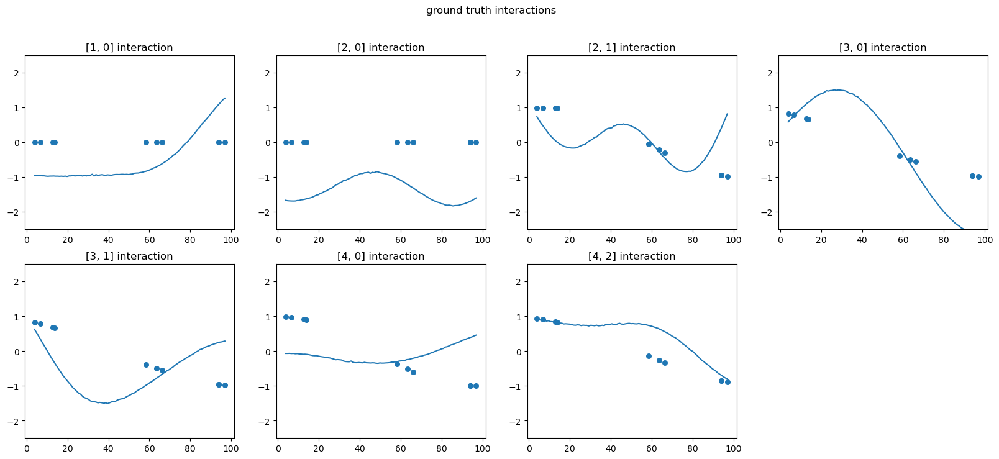

30 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 351.5734:  17%|███▎               | 17153/100000 [00:33<02:43, 506.28it/s]


Early stopping at iteration 17154, loss: 325.4527


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
100%|███████████████████████████████████████| 1000/1000 [00:19<00:00, 50.69it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


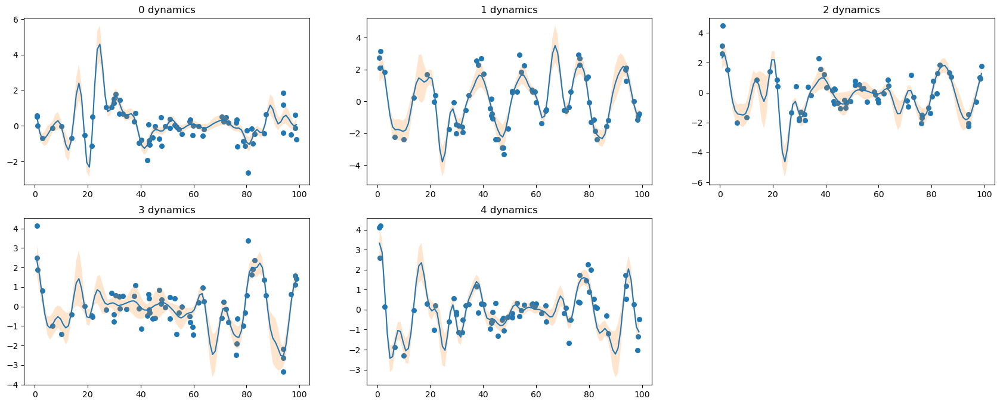

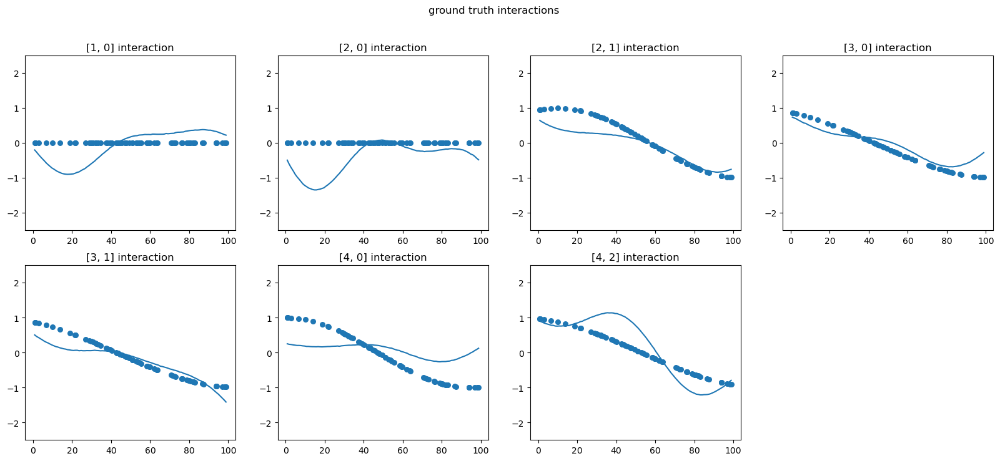

40 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 308.2049:  24%|████▍              | 23622/100000 [00:40<02:11, 579.75it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 23623, loss: 339.4779


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 59.38it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


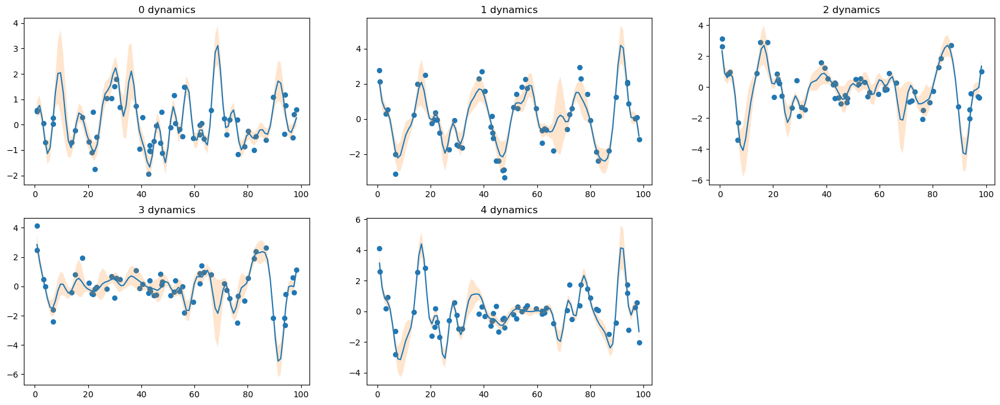

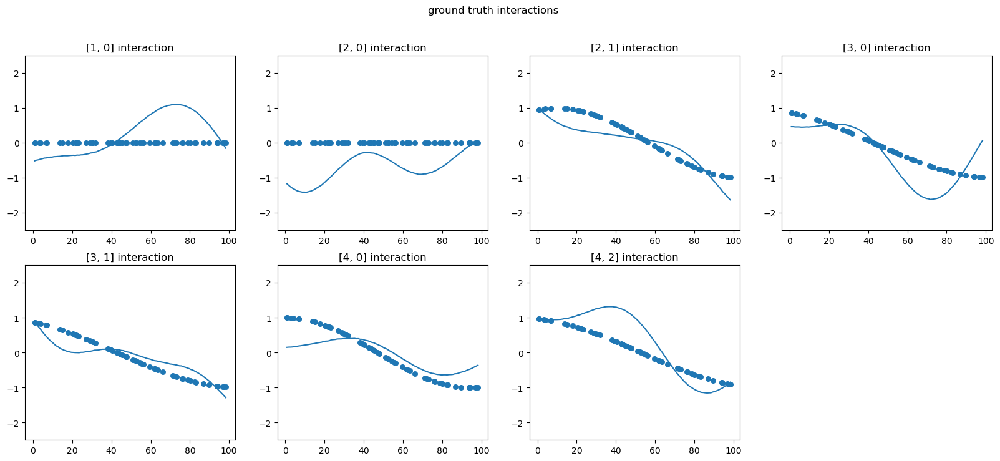

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 364.5204:  23%|████▎              | 22965/100000 [00:35<02:00, 640.51it/s]


Early stopping at iteration 22966, loss: 395.9608


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 60.83it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


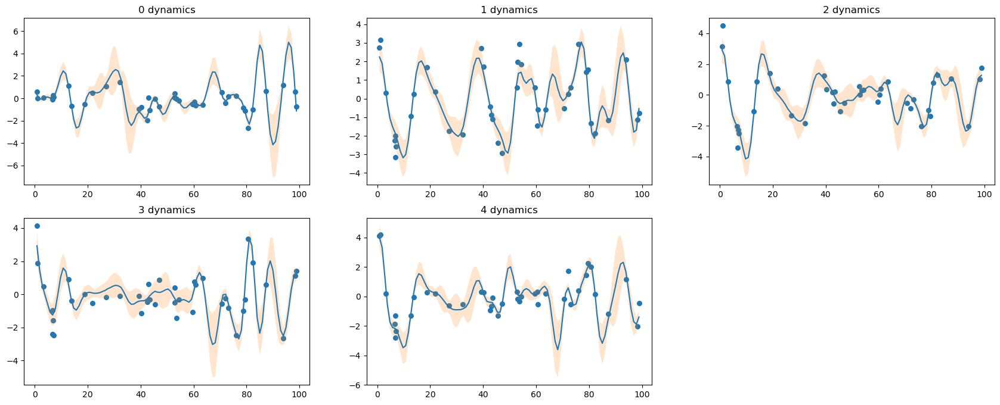

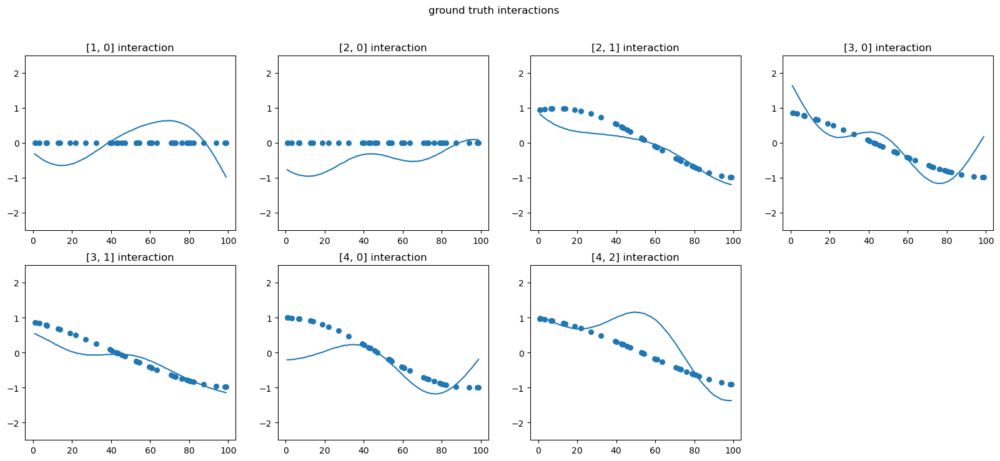

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 426.9416:  25%|████▋              | 24710/100000 [00:36<01:52, 670.99it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 24711, loss: 386.1048


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 64.96it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


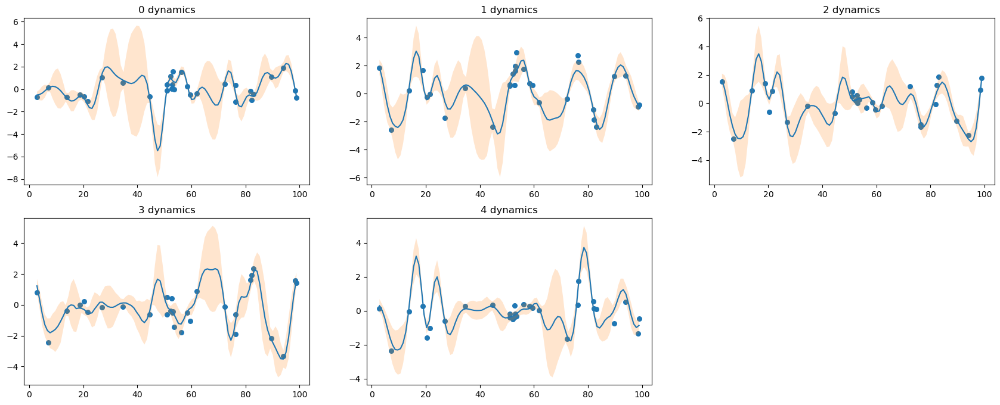

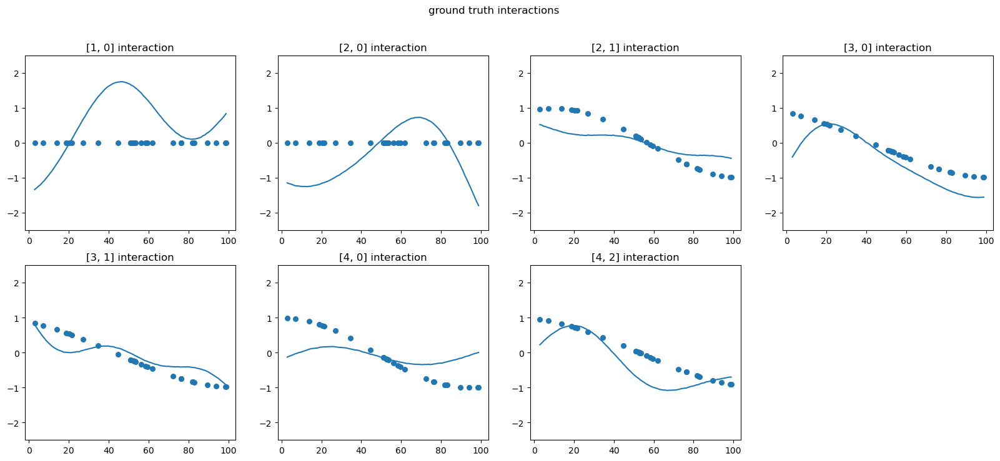

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 430.4702:  14%|██▋                | 14142/100000 [00:19<02:01, 709.13it/s]


Early stopping at iteration 14143, loss: 502.4518


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 62.93it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


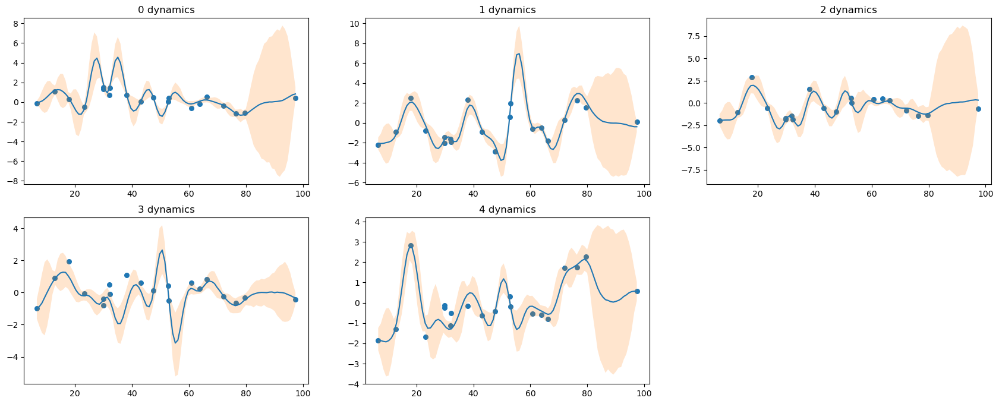

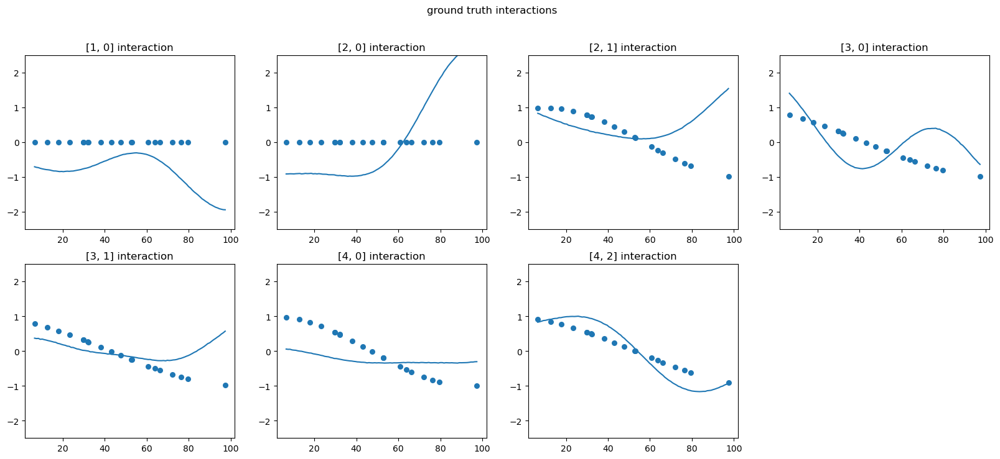

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 7--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 606.7617:  13%|██▍                | 13069/100000 [00:17<01:59, 729.57it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 13070, loss: 609.9198


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 59.87it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


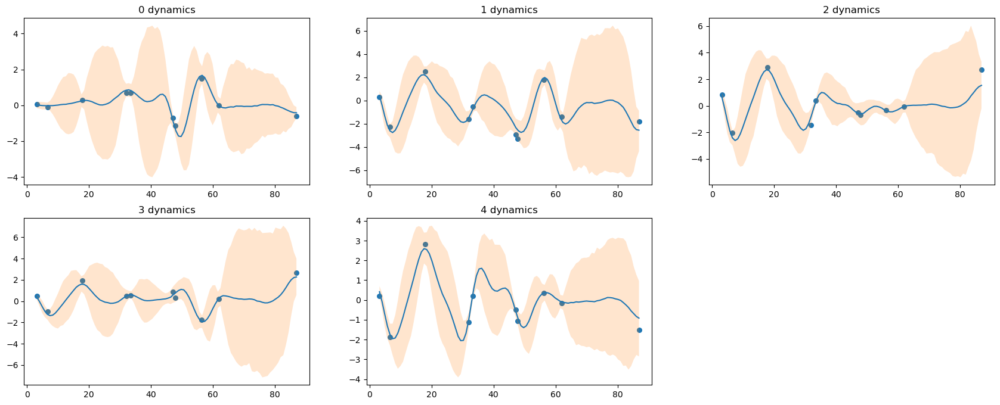

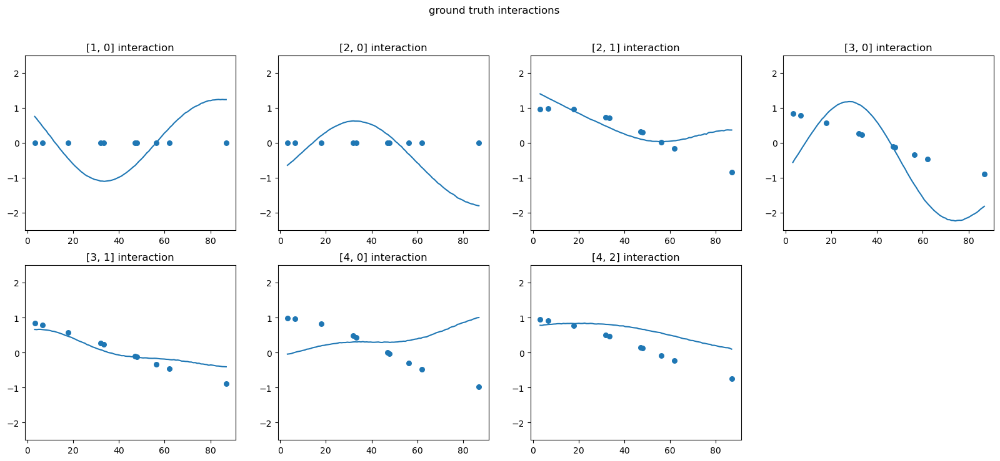

30 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 289.5214:  29%|█████▍             | 28850/100000 [00:56<02:19, 509.27it/s]


Early stopping at iteration 28851, loss: 280.0277


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.57it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


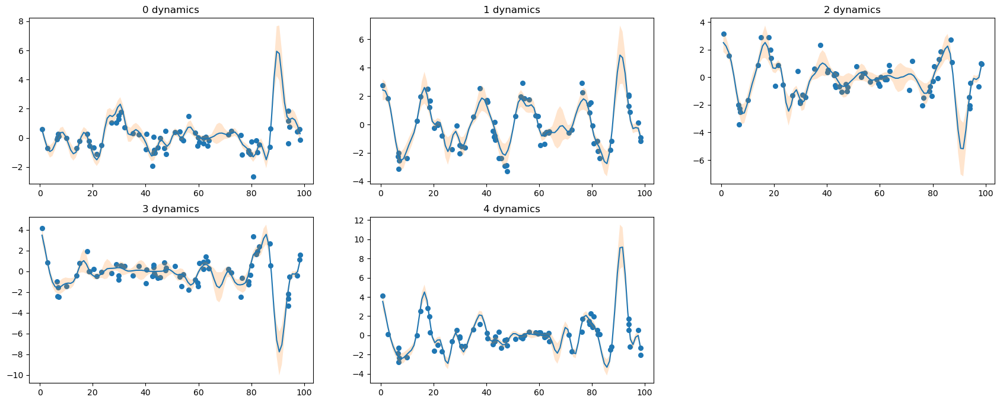

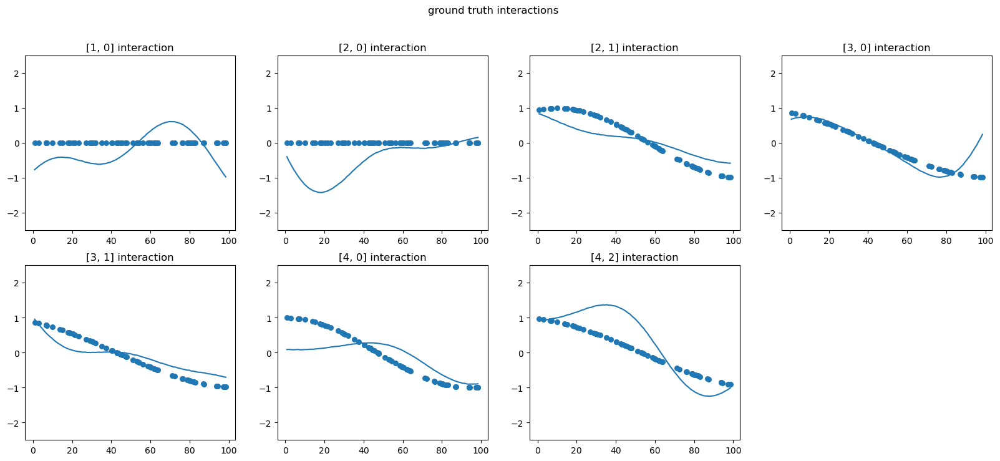

40 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 306.9046:  20%|███▊               | 19938/100000 [00:33<02:14, 595.23it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 19939, loss: 329.6051


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 63.17it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


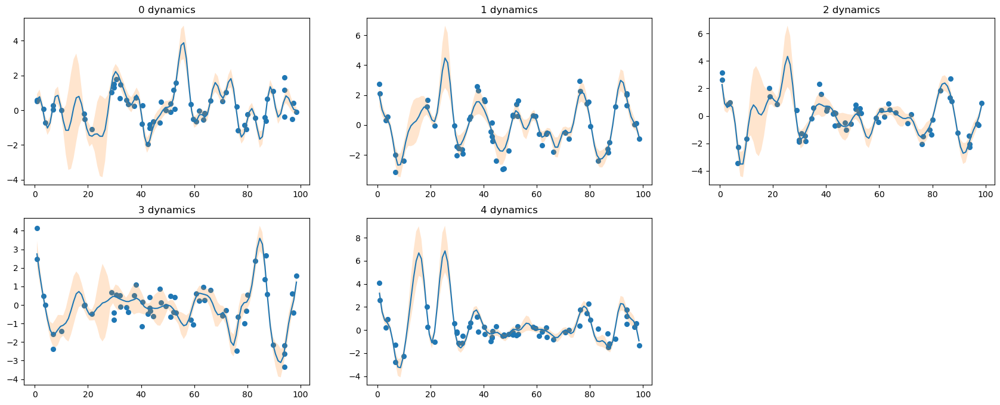

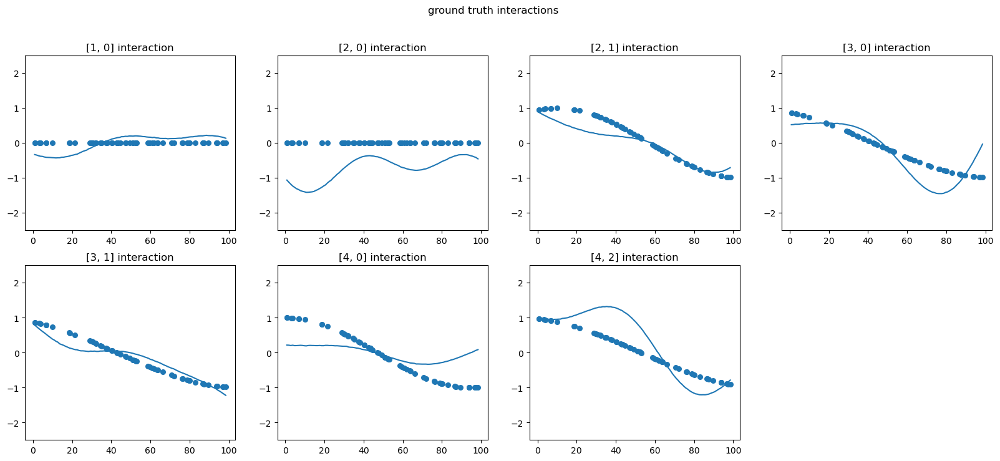

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 345.4256:  19%|███▌               | 18782/100000 [00:28<02:02, 660.85it/s]


Early stopping at iteration 18783, loss: 345.2713


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 69.36it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


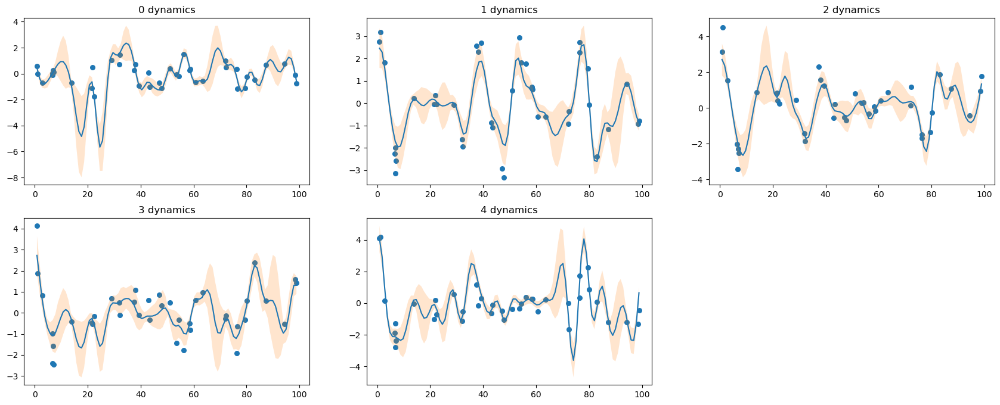

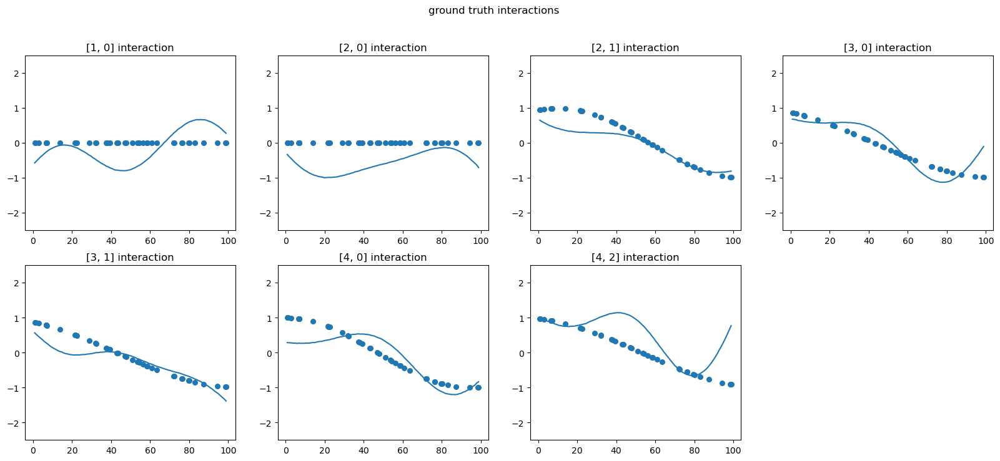

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 378.7202:  15%|██▊                | 14877/100000 [00:21<02:03, 689.90it/s]


Early stopping at iteration 14878, loss: 374.2480


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.74it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


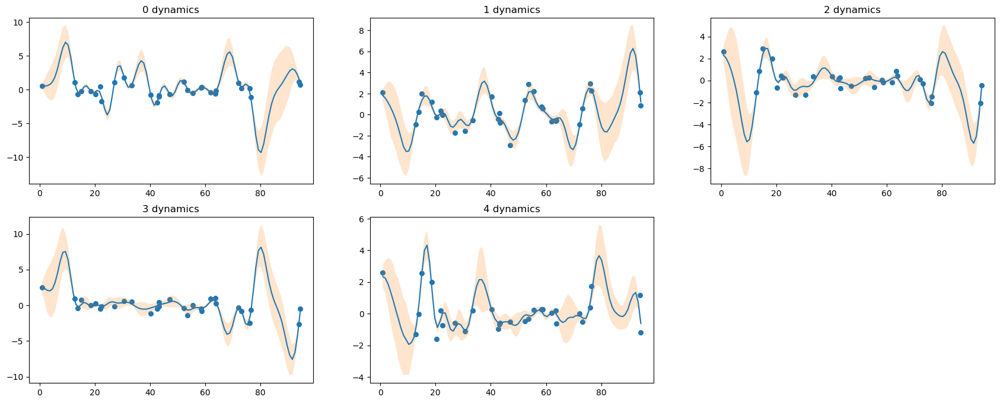

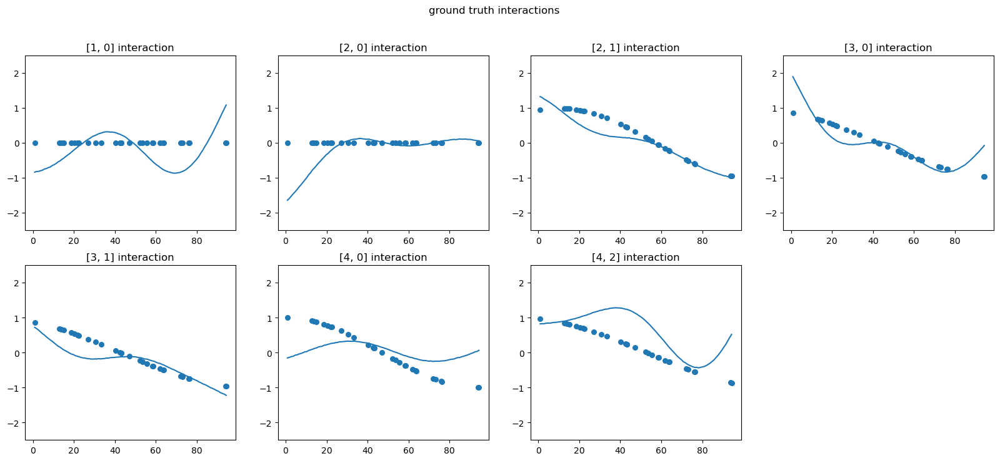

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 441.5503:  15%|██▉                | 15134/100000 [00:20<01:56, 728.37it/s]


Early stopping at iteration 15135, loss: 483.4268


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 65.70it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


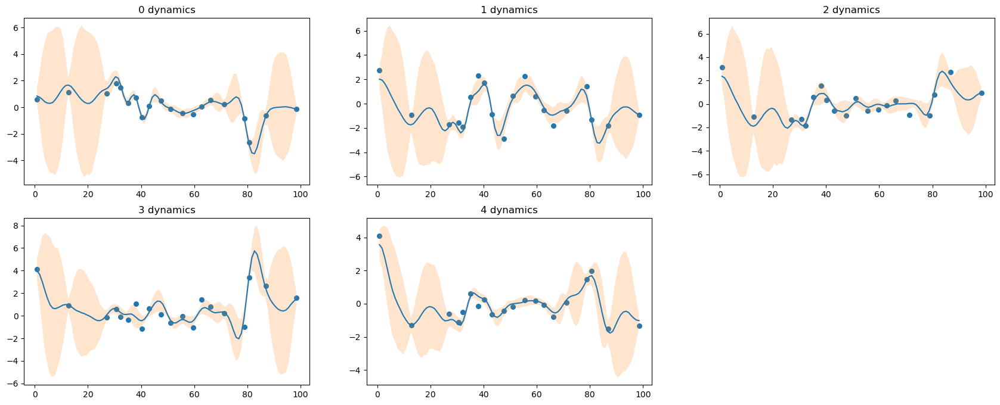

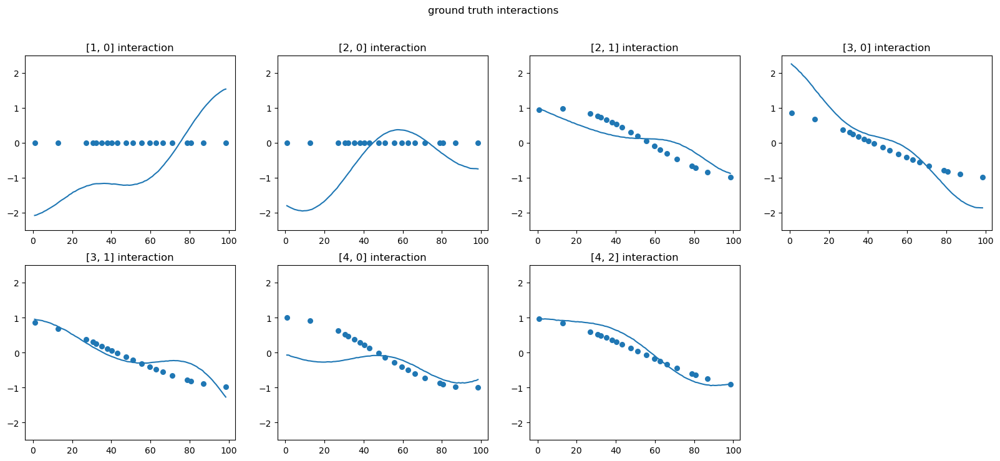

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 8--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 688.5779:  12%|██▎                | 12430/100000 [00:16<01:57, 747.48it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 12431, loss: 671.3057


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 66.31it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


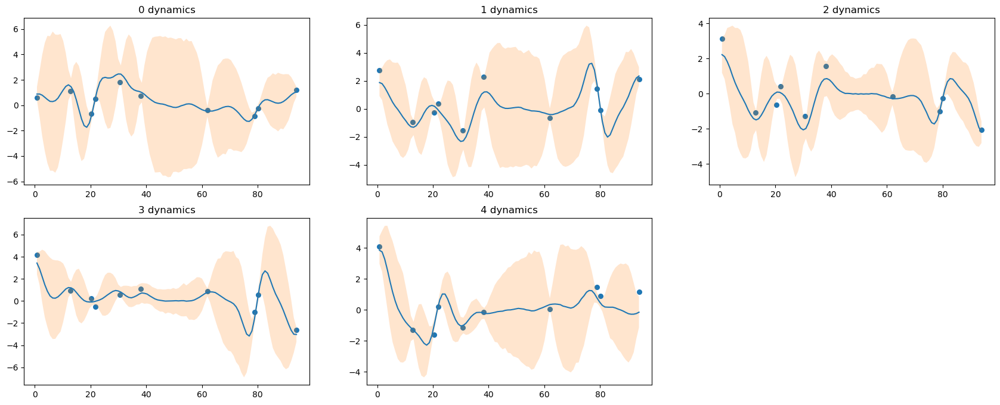

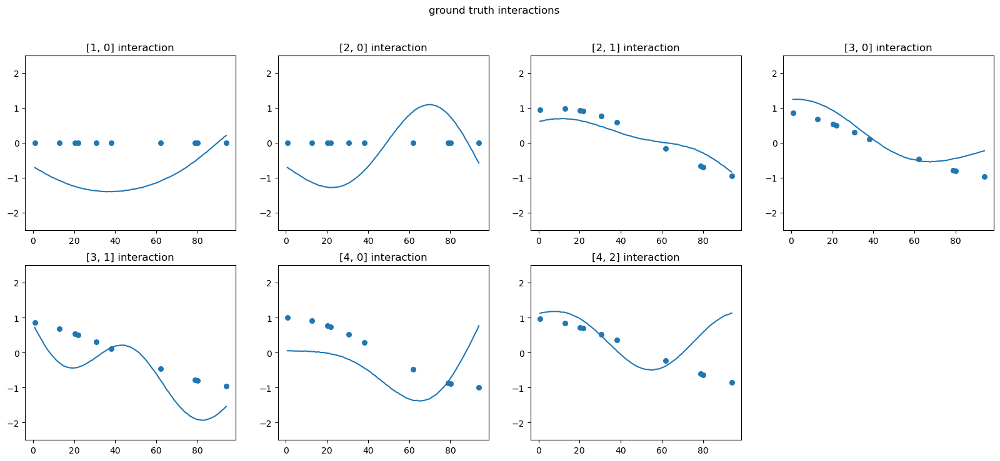

30 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(70, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 314.9608:  40%|███████▌           | 39565/100000 [01:15<01:55, 525.21it/s]


Early stopping at iteration 39566, loss: 319.1061


100%|███████████████████████████████████████| 1000/1000 [00:17<00:00, 56.48it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


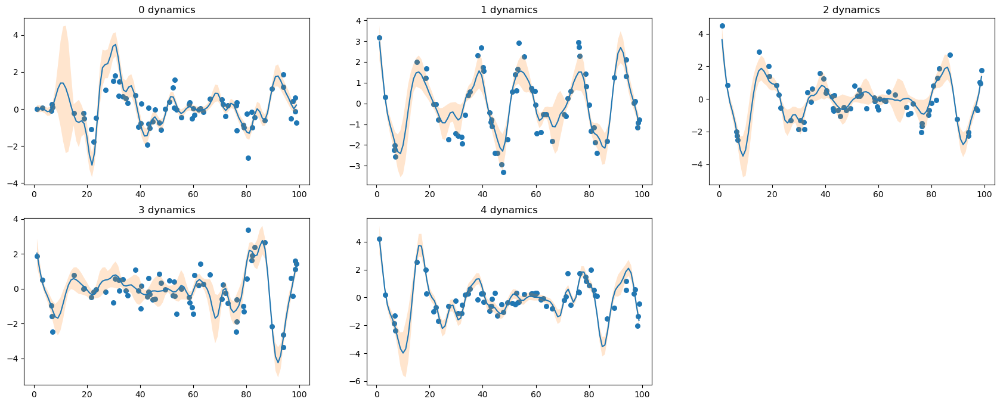

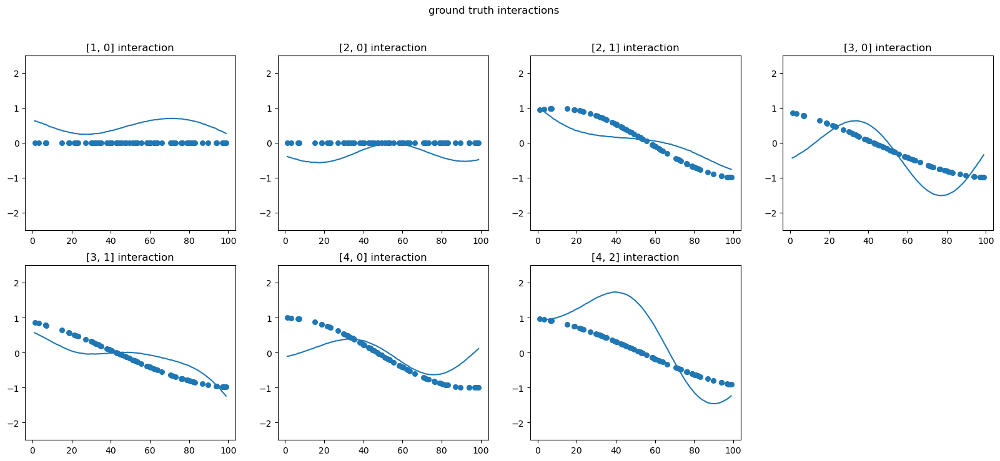

40 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(60, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 338.1814:  29%|█████▍             | 28835/100000 [00:48<01:59, 597.05it/s]


Early stopping at iteration 28836, loss: 367.1445


100%|███████████████████████████████████████| 1000/1000 [00:16<00:00, 61.85it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


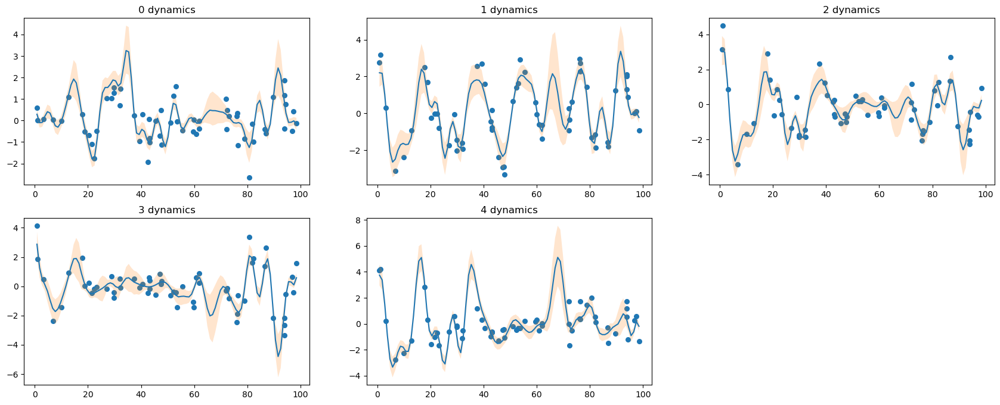

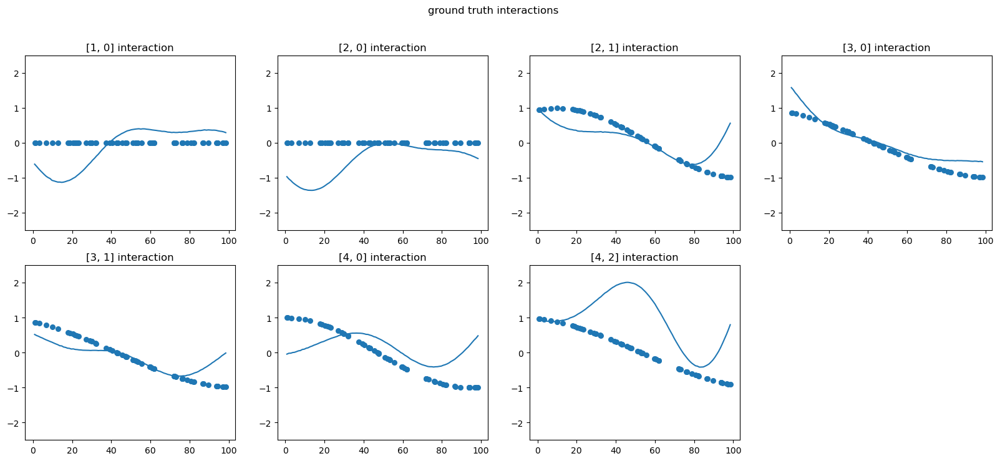

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

60 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(40, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 357.2333:  17%|███▎               | 17414/100000 [00:26<02:05, 657.43it/s]
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Early stopping at iteration 17415, loss: 357.4365


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 67.34it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


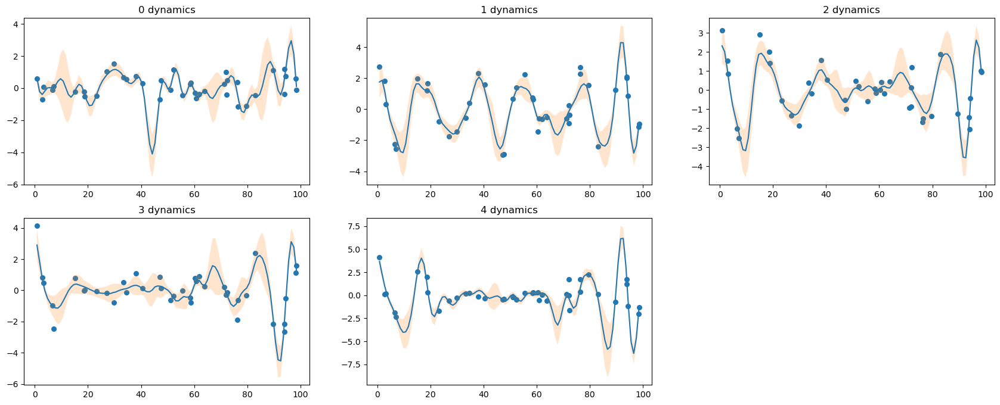

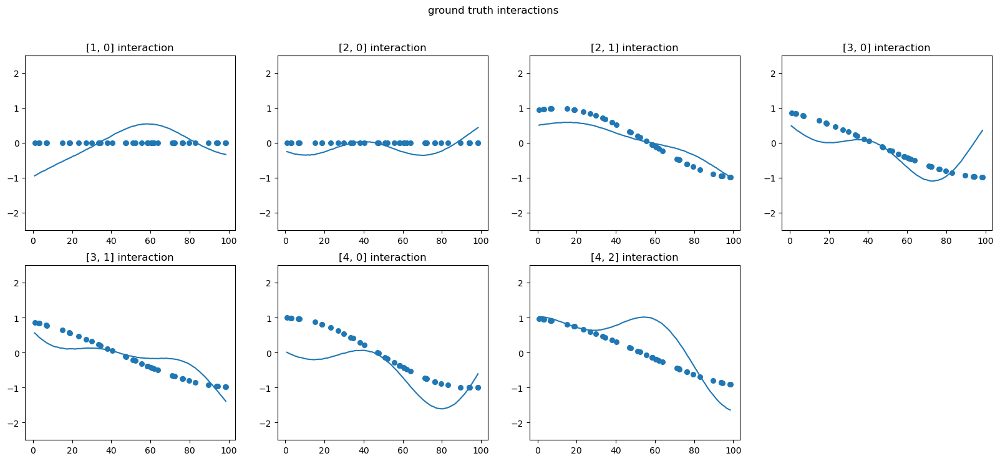

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

70 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(30, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 393.3470:  23%|████▍              | 23338/100000 [00:33<01:51, 686.51it/s]


Early stopping at iteration 23339, loss: 413.5804


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 70.53it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


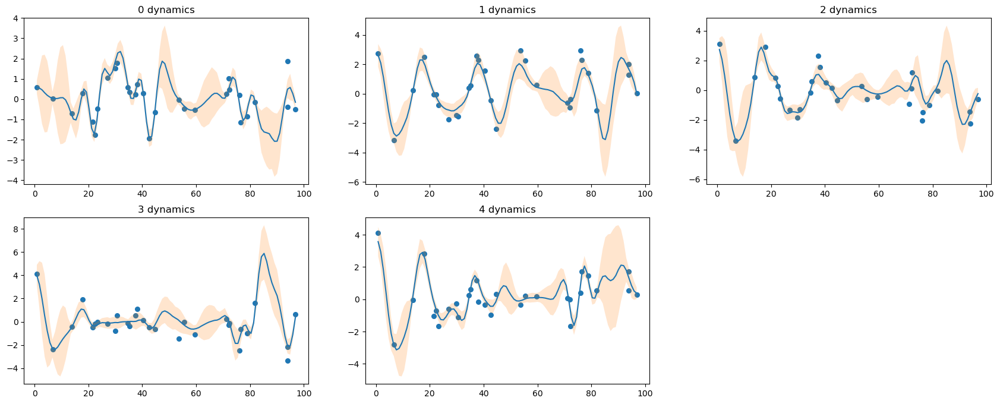

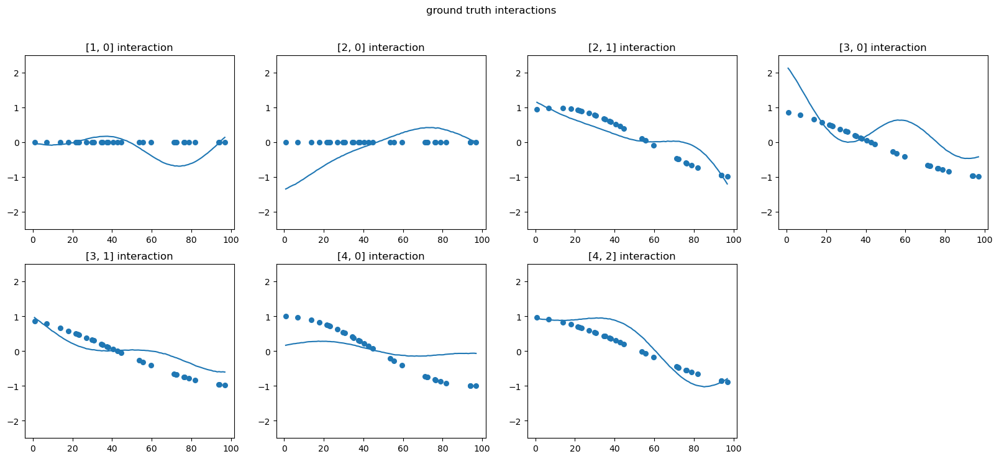

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

80 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(20, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 505.1719:  10%|█▉                 | 10461/100000 [00:14<02:03, 726.72it/s]


Early stopping at iteration 10462, loss: 465.3378


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 63.66it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


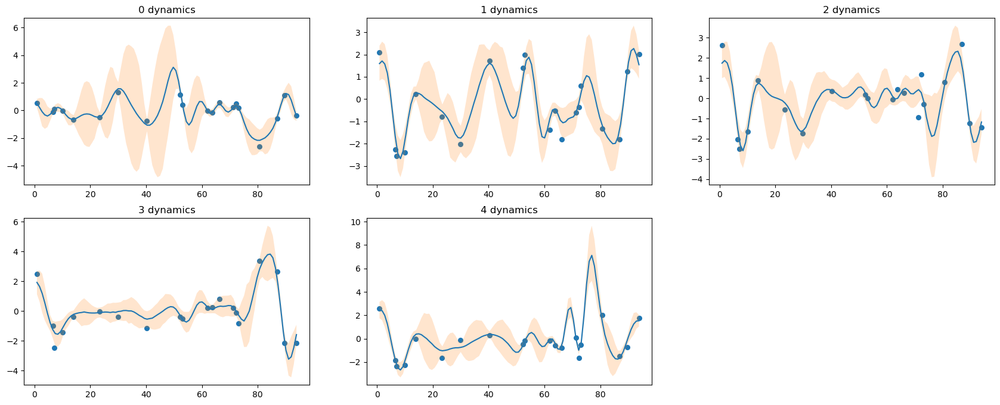

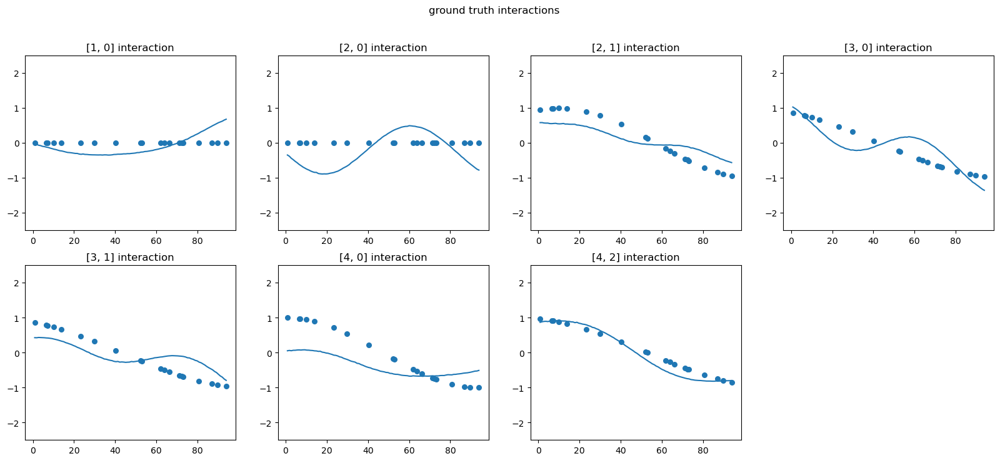

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precis

90 DROPPED TIMEPOINTS, ITERATION 9--------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------
(100, 5)
(10, 5)
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': True, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': True}
{'min_points_per_regression': 3, 'num_searches_per_timepoint': 10, 'use_bias': False, 'epsilon': 0.5, 'ignore_is_active': False, 'ignore_epsilon': False}
{'use_bias': False, 'ignore_is_active': False}
{'w_length_scale': 30, 'w_length_scale_range': 10, 'w_variance': 10, 'y_length_scale': 5, 'y_variance': 3, 'y_sigma': 0.1, 'lr': 0.005, 'verbose': True, 'verbose_freq': 100, 'patience': 5000, 'n_iter': 100000}


  0%|                                                | 0/100000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'lengthscale_w'}
  warnings.warn(
loss: 631.0660:  14%|██▌                | 13571/100000 [00:18<01:55, 748.30it/s]


Early stopping at iteration 13572, loss: 573.8562


100%|███████████████████████████████████████| 1000/1000 [00:15<00:00, 65.78it/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


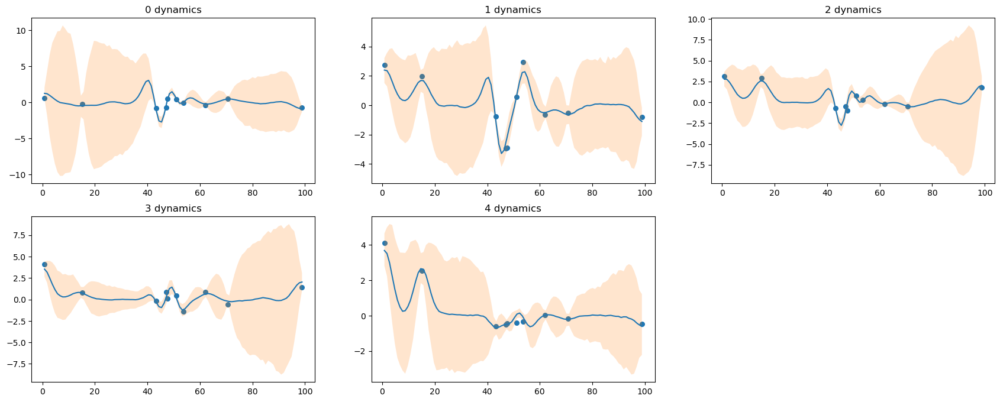

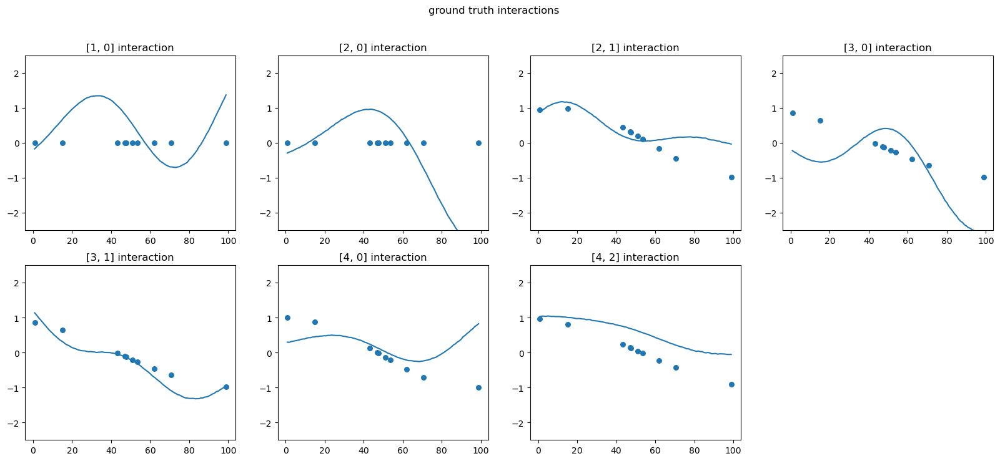

In [7]:
# P_arr = [0.2,0.4,0.6,0.7,0.8,0.9]
# P_arr = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
P_arr = [
    30,40, 60,70,80,90
]
import random
for iter in range(10):
    for P in P_arr:
        print(f'{P} DROPPED TIMEPOINTS, ITERATION {iter}--------------------------------------------------------------------------')
        print('--------------------------------------------------------------------------------------------------------------')
        # print(P, int(np.floor(P*len(timepoints))))
        timepoints, data, W, lambda_matrix = generate_data()
        drop_timepoints = random.sample(range(len(timepoints)), P)
        # np.random.randint(low = 0, high = len(timepoints), size=P)
        timepoints = np.delete(timepoints,drop_timepoints)
        data = np.delete(data,drop_timepoints, axis = 0)
        W = np.delete(W,drop_timepoints, axis = 0)
        print(data.shape)
        from evals.generate_data import create_true_interactions_from_dependent_computations, create_model_prior_from_true_interactions
        true_interactions = create_true_interactions_from_dependent_computations(
            W, 0.1
        )
        model_prior = create_model_prior_from_true_interactions(
            true_interactions, 0, 0
        )
        
        # add 0's to the simulations
        # remove 5-1, 4-1 link
        RUN = "figure2_run_4_noise0.5"
    
        
        model_cls_arr = {
            "LinearModel":LinearModel, 
            "RollingLinearModel":RollingLinearModel, 
            "DiiscoModel":DiiscoModel
        }
        
        # df = pd.DataFrame(columns = ['a','b'])
        
        
        model_string = 'RollingLinearModel'
        
        model_cls = model_cls_arr[model_string]
        
        config = get_default_parameters(model_cls)
        
        if model_cls == RollingLinearModel:
            assert "epsilon" in config
            config["epsilon"] = 0.5
            
        config['ignore_is_active'] = True
        
        print(config)
        model = model_cls(**config)
        
        model.fit(
            t=timepoints, y=data, is_active=lambda_matrix
        )
        
        interaction_score = model.predict_obs_interactions()
        interaction_metrics: InteractionMetrics = evaluate_predicted_interactions(
            true_interactions=true_interactions,
            interaction_score=interaction_score,
            observations=data,
            timepoints=timepoints,
        )
        
        # # print("\n\ninteraction_score", interaction_score.astype(int)[0])
        # # print("\n\ntrue_interactions", dataset.true_interactions.astype(int)[0])
        
        true_observations = data
        predicted_observations = model.predict_y_train()
        
        # # print("\n\ntrue_observations", true_observations)
        # # print("\n\npredicted_observations", predicted_observations)
        
        observation_metrics: ObservationMetrics = evaluate_predicted_observations(
            true_observations=true_observations,
            predicted_observations=predicted_observations,
        )
    
        observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
            true_observations=W,
            predicted_observations=interaction_score[:,:,:],
        )
        
        run_name = generate_run_name()
        save_pth = create_and_return_save_pth("./cam_results",  RUN, f'{model_string}_noprior_{P}_droppedT_{iter}')
        
        run_results = RunResults(
            # Metrics pertaining the values of y
            r2=observation_metrics.r2,
            mse=observation_metrics.mse,
            rmse=observation_metrics.rmse,
            mae=observation_metrics.mae,
        
            # Metrics pertaining the interactions
            r2_W=observation_metrics_interactions.r2,
            rmse_W=observation_metrics_interactions.rmse,
            stds=interaction_metrics.stds,
            accuracies=interaction_metrics.accuracies,
            precisions=interaction_metrics.precisions,
            recalls=interaction_metrics.recalls,
            f1_scores=interaction_metrics.f1_scores,
            auc=interaction_metrics.auc,
            prc_auc=interaction_metrics.prc_auc,
            symmetrical_auc=interaction_metrics.symmetrical_auc,
            symmetrical_prc_auc=interaction_metrics.symmetrical_prc_auc,
            true_interactions=interaction_metrics.true_interactions,
            transformed_interactions=interaction_metrics.transformed_interactions,
            symmetrical_transformed_interactions=interaction_metrics.symmetrical_transformed_interactions,
        
            # Predicted
            predicted_interactions=interaction_score.tolist(),
            predicted_observations=predicted_observations.tolist(),
        
            # Metrics pertaining the dataset
            n_cells=data.shape[1],
            n_timepoints=data.shape[0],
            n_independent_per_block='',
            n_dependent_per_block='',
            noise='',
            p_active='',
            flip_prob_active=0.1,
            flip_prob_inactive=0.1,
            threshold_for_active=0.1,
            seed='',
        
            # Dataset stuff
            weights=W.tolist(),
            standardized_observations=true_observations.tolist(),
            observations=true_observations.tolist(),
            timepoints=timepoints.tolist(),
            # Stuff pertaining the model itself
            model_name=model_string,
            config=config,
            run_name=run_name,
        )
        
        save_run_results(run_results, save_pth)
        
        model_string = 'LinearModel'
        model_cls = model_cls_arr[model_string]
        
        config = get_default_parameters(model_cls)
        
        config['ignore_is_active'] = True
        
        print(config)
        model = model_cls(**config)
        
        model.fit(
            t=timepoints, y=data, is_active=lambda_matrix
        )
        
        interaction_score = model.predict_obs_interactions()
        interaction_metrics: InteractionMetrics = evaluate_predicted_interactions(
            true_interactions=true_interactions,
            interaction_score=interaction_score,
            observations=data,
            timepoints=timepoints,
        )
        
        # # print("\n\ninteraction_score", interaction_score.astype(int)[0])
        # # print("\n\ntrue_interactions", dataset.true_interactions.astype(int)[0])
        
        true_observations = data
        predicted_observations = model.predict_y_train()
        
        # # print("\n\ntrue_observations", true_observations)
        # # print("\n\npredicted_observations", predicted_observations)
        
        observation_metrics: ObservationMetrics = evaluate_predicted_observations(
            true_observations=true_observations,
            predicted_observations=predicted_observations,
        )
    
    
        observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
            true_observations=W,
            predicted_observations=interaction_score[:,:,:],
        )
    
        run_name = generate_run_name()
        save_pth = create_and_return_save_pth("./cam_results",  RUN, f'{model_string}_noprior_{P}_droppedT_{iter}')
        
        run_results = RunResults(
            # Metrics pertaining the values of y
            r2=observation_metrics.r2,
            mse=observation_metrics.mse,
            rmse=observation_metrics.rmse,
            mae=observation_metrics.mae,
        
            # Metrics pertaining the interactions
            r2_W=observation_metrics_interactions.r2,
            rmse_W=observation_metrics_interactions.rmse,
            stds=interaction_metrics.stds,
            accuracies=interaction_metrics.accuracies,
            precisions=interaction_metrics.precisions,
            recalls=interaction_metrics.recalls,
            f1_scores=interaction_metrics.f1_scores,
            auc=interaction_metrics.auc,
            prc_auc=interaction_metrics.prc_auc,
            symmetrical_auc=interaction_metrics.symmetrical_auc,
            symmetrical_prc_auc=interaction_metrics.symmetrical_prc_auc,
            true_interactions=interaction_metrics.true_interactions,
            transformed_interactions=interaction_metrics.transformed_interactions,
            symmetrical_transformed_interactions=interaction_metrics.symmetrical_transformed_interactions,
        
            # Predicted
            predicted_interactions=interaction_score.tolist(),
            predicted_observations=predicted_observations.tolist(),
        
            # Metrics pertaining the dataset
            n_cells=data.shape[1],
            n_timepoints=data.shape[0],
            n_independent_per_block='',
            n_dependent_per_block='',
            noise='',
            p_active='',
            flip_prob_active=0.1,
            flip_prob_inactive=0.1,
            threshold_for_active=0.1,
            seed='',
        
            # Dataset stuff
            weights=W.tolist(),
            standardized_observations=true_observations.tolist(),
            observations=true_observations.tolist(),
            timepoints=timepoints.tolist(),
            # Stuff pertaining the model itself
            model_name=model_string,
            config=config,
            run_name=run_name,
        )
        
        save_run_results(run_results, save_pth)
        
        
        
        # add 0's to the simulations
        # remove 5-1, 4-1 link
    
        model_cls_arr = {
            "LinearModel":LinearModel, 
            "RollingLinearModel":RollingLinearModel, 
            "DiiscoModel":DiiscoModel
        }
        
        # df = pd.DataFrame(columns = ['a','b'])
        
        
        model_string = 'RollingLinearModel'
        
        model_cls = model_cls_arr[model_string]
        
        config = get_default_parameters(model_cls)
        
        if model_cls == RollingLinearModel:
            assert "epsilon" in config
            config["epsilon"] = 0.5
            
        config['ignore_is_active'] = False
        
        print(config)
        model = model_cls(**config)
        
        model.fit(
            t=timepoints, y=data, is_active=lambda_matrix
        )
        
        interaction_score = model.predict_obs_interactions()
        interaction_metrics: InteractionMetrics = evaluate_predicted_interactions(
            true_interactions=true_interactions,
            interaction_score=interaction_score,
            observations=data,
            timepoints=timepoints,
        )
        
        # # print("\n\ninteraction_score", interaction_score.astype(int)[0])
        # # print("\n\ntrue_interactions", dataset.true_interactions.astype(int)[0])
        
        true_observations = data
        predicted_observations = model.predict_y_train()
        
        # # print("\n\ntrue_observations", true_observations)
        # # print("\n\npredicted_observations", predicted_observations)
        
        observation_metrics: ObservationMetrics = evaluate_predicted_observations(
            true_observations=true_observations,
            predicted_observations=predicted_observations,
        )
        observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
            true_observations=W,
            predicted_observations=interaction_score[:,:,:],
        )
        run_name = generate_run_name()
        save_pth = create_and_return_save_pth("./cam_results",  RUN, f'{model_string}_{P}_droppedT_{iter}')
        
        run_results = RunResults(
            # Metrics pertaining the values of y
            r2=observation_metrics.r2,
            mse=observation_metrics.mse,
            rmse=observation_metrics.rmse,
            mae=observation_metrics.mae,
        
            # Metrics pertaining the interactions
            r2_W=observation_metrics_interactions.r2,
            rmse_W=observation_metrics_interactions.rmse,
            stds=interaction_metrics.stds,
            accuracies=interaction_metrics.accuracies,
            precisions=interaction_metrics.precisions,
            recalls=interaction_metrics.recalls,
            f1_scores=interaction_metrics.f1_scores,
            auc=interaction_metrics.auc,
            prc_auc=interaction_metrics.prc_auc,
            symmetrical_auc=interaction_metrics.symmetrical_auc,
            symmetrical_prc_auc=interaction_metrics.symmetrical_prc_auc,
            true_interactions=interaction_metrics.true_interactions,
            transformed_interactions=interaction_metrics.transformed_interactions,
            symmetrical_transformed_interactions=interaction_metrics.symmetrical_transformed_interactions,
        
            # Predicted
            predicted_interactions=interaction_score.tolist(),
            predicted_observations=predicted_observations.tolist(),
        
            # Metrics pertaining the dataset
            n_cells=data.shape[1],
            n_timepoints=data.shape[0],
            n_independent_per_block='',
            n_dependent_per_block='',
            noise='',
            p_active='',
            flip_prob_active=0.1,
            flip_prob_inactive=0.1,
            threshold_for_active=0.1,
            seed='',
        
            # Dataset stuff
            weights=W.tolist(),
            standardized_observations=true_observations.tolist(),
            observations=true_observations.tolist(),
            timepoints=timepoints.tolist(),
            # Stuff pertaining the model itself
            model_name=model_string,
            config=config,
            run_name=run_name,
        )
        
        save_run_results(run_results, save_pth)
        
        model_string = 'LinearModel'
        model_cls = model_cls_arr[model_string]
        
        config = get_default_parameters(model_cls)
        
        config['ignore_is_active'] = False
        
        print(config)
        model = model_cls(**config)
        
        model.fit(
            t=timepoints, y=data, is_active=lambda_matrix
        )
        
        interaction_score = model.predict_obs_interactions()
        interaction_metrics: InteractionMetrics = evaluate_predicted_interactions(
            true_interactions=true_interactions,
            interaction_score=interaction_score,
            observations=data,
            timepoints=timepoints,
        )
        
        # # print("\n\ninteraction_score", interaction_score.astype(int)[0])
        # # print("\n\ntrue_interactions", dataset.true_interactions.astype(int)[0])
        
        true_observations = data
        predicted_observations = model.predict_y_train()
        
        # # print("\n\ntrue_observations", true_observations)
        # # print("\n\npredicted_observations", predicted_observations)
        
        observation_metrics: ObservationMetrics = evaluate_predicted_observations(
            true_observations=true_observations,
            predicted_observations=predicted_observations,
        )
    
        observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
            true_observations=W,
            predicted_observations=interaction_score[:,:,:],
        )
        
        run_name = generate_run_name()
        save_pth = create_and_return_save_pth("./cam_results",  RUN, f'{model_string}_{P}_droppedT_{iter}')
        
        run_results = RunResults(
            # Metrics pertaining the values of y
            r2=observation_metrics.r2,
            mse=observation_metrics.mse,
            rmse=observation_metrics.rmse,
            mae=observation_metrics.mae,
        
            # Metrics pertaining the interactions
            r2_W=observation_metrics_interactions.r2,
            rmse_W=observation_metrics_interactions.rmse,
            stds=interaction_metrics.stds,
            accuracies=interaction_metrics.accuracies,
            precisions=interaction_metrics.precisions,
            recalls=interaction_metrics.recalls,
            f1_scores=interaction_metrics.f1_scores,
            auc=interaction_metrics.auc,
            prc_auc=interaction_metrics.prc_auc,
            symmetrical_auc=interaction_metrics.symmetrical_auc,
            symmetrical_prc_auc=interaction_metrics.symmetrical_prc_auc,
            true_interactions=interaction_metrics.true_interactions,
            transformed_interactions=interaction_metrics.transformed_interactions,
            symmetrical_transformed_interactions=interaction_metrics.symmetrical_transformed_interactions,
        
            # Predicted
            predicted_interactions=interaction_score.tolist(),
            predicted_observations=predicted_observations.tolist(),
        
            # Metrics pertaining the dataset
            n_cells=data.shape[1],
            n_timepoints=data.shape[0],
            n_independent_per_block='',
            n_dependent_per_block='',
            noise='',
            p_active='',
            flip_prob_active=0.1,
            flip_prob_inactive=0.1,
            threshold_for_active=0.1,
            seed='',
        
            # Dataset stuff
            weights=W.tolist(),
            standardized_observations=true_observations.tolist(),
            observations=true_observations.tolist(),
            timepoints=timepoints.tolist(),
            # Stuff pertaining the model itself
            model_name=model_string,
            config=config,
            run_name=run_name,
        )
        
        save_run_results(run_results, save_pth)
        
        
        model_string = 'DiiscoModel'
        model_cls = model_cls_arr[model_string]
        
        config = get_default_parameters(model_cls)
        
        # config['ignore_is_active'] = True
        if model_cls == DiiscoModel:
            assert "w_length_scale" in config
            config["w_length_scale"] = 30
        
            assert "y_length_scale" in config
            config["y_length_scale"] =5
        
            assert "y_sigma" in config
            config["y_sigma"] = 0.1
        
        
            assert "y_variance" in config
            config["y_variance"] = 3
        
            
            assert "w_variance" in config
            config["w_variance"] = 10
        
        
            assert 'w_length_scale_range' in config
            config['w_length_scale_range'] = 10
        
            assert "lr" in config
            config["lr"] = 0.005
            
        print(config)
        model = model_cls(**config)
        
        model.fit(
            t=timepoints, y=data, is_active=lambda_matrix
        )
        
        interaction_score = model.predict_obs_interactions()
        # interaction_score_dict_2[P] = interaction_score
        interaction_metrics: InteractionMetrics = evaluate_predicted_interactions(
            true_interactions=true_interactions,
            interaction_score=interaction_score,
            observations=data,
            timepoints=timepoints,
        )
        
        # # print("\n\ninteraction_score", interaction_score.astype(int)[0])
        # # print("\n\ntrue_interactions", dataset.true_interactions.astype(int)[0])
        
        true_observations = data
        predicted_observations = model.predict_y_train()
        
        # # print("\n\ntrue_observations", true_observations)
        # # print("\n\npredicted_observations", predicted_observations)
        
        observation_metrics: ObservationMetrics = evaluate_predicted_observations(
            true_observations=true_observations,
            predicted_observations=predicted_observations,
        )
    
        observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
            true_observations=W,
            predicted_observations=interaction_score[:,:,:],
        )
    
    
        sample_dict,time_points = model.get_predictions()
        time_points = time_points.squeeze().numpy()
        
        W_samples_predict = sample_dict['W']
        y_samples_predict = sample_dict['Y']
        f_samples_predict = sample_dict['F']
        
        
        ### PLOT 
        
        n = 5; max_cols = 3
        nrows = int(np.ceil(n / max_cols)); ncols = int(min((max_cols, n)))
        fig = plt.figure(figsize=[7 * ncols, 4 * nrows])
        for i in range(5):
            ax = fig.add_subplot(nrows, ncols, i+1)
            y = data[:,i]
            # if np.max(np.abs(y)) < 0.05: continue
            ax.scatter(timepoints,y, s = 30)
            y_pred = y_samples_predict[:,:,i].mean(axis = 0)
            ax.plot(time_points,y_pred)
            ax.set_title(f'{i} dynamics')
            # ax.set_ylim((np.min(y_pred)-0.3,np.max(y_pred)+0.3))
            percentile_75 = np.percentile(y_samples_predict[:,:,i], 95, axis=0)
            percentile_25 = np.percentile(y_samples_predict[:,:,i], 5, axis=0)
            ax.fill_between(time_points, percentile_25, percentile_75, alpha=0.2)
        # plt.suptitle(f"ground truth dynamics vs diisco predictions")
        plt.savefig(f'./cam_results/{RUN}/diisco_dynamics_{P}_dropped_{iter}.eps')
        plt.show()
        
        
        interaction_plots = []
        for i in range(5):
            for j in range(5):
                # print(i,j)
                if i == j: continue
                y = W_samples_predict[:, :,i, j].detach().numpy()
                if np.max(np.abs(y)) > 0.005: 
                    interaction_plots.append([i,j])
                    
        n = len(interaction_plots); max_cols = 4
        nrows = int(np.ceil(n / max_cols)); ncols = int(min((max_cols, n)))
        fig = plt.figure(figsize=[5 * ncols, 4 * nrows])
        for i,interaction in enumerate(interaction_plots):
            ax = fig.add_subplot(nrows, ncols, i+1)
            y = W[:,interaction[0],interaction[1]]
            ax.scatter(timepoints,y, s = 30)
            ax.plot(time_points, 
                             W_samples_predict[:, :,interaction[0], interaction[1]].mean(axis=0))
            ax.set_title(f'{interaction} interaction')
            ax.set_ylim(-2.5,2.5)
        plt.suptitle("ground truth interactions")
        plt.savefig(f'./cam_results/{RUN}/diisco_interactions_{P}_dropped_{iter}.eps')
        plt.show()
        
        run_name = generate_run_name()
        save_pth = create_and_return_save_pth("./cam_results",  RUN, f'{model_string}_{P}_droppedT_{iter}')
        
        run_results = RunResults(
            # Metrics pertaining the values of y
            r2=observation_metrics.r2,
            mse=observation_metrics.mse,
            rmse=observation_metrics.rmse,
            mae=observation_metrics.mae,
        
            # Metrics pertaining the interactions
            r2_W=observation_metrics_interactions.r2,
            rmse_W=observation_metrics_interactions.rmse,
            stds=interaction_metrics.stds,
            accuracies=interaction_metrics.accuracies,
            precisions=interaction_metrics.precisions,
            recalls=interaction_metrics.recalls,
            f1_scores=interaction_metrics.f1_scores,
            auc=interaction_metrics.auc,
            prc_auc=interaction_metrics.prc_auc,
            symmetrical_auc=interaction_metrics.symmetrical_auc,
            symmetrical_prc_auc=interaction_metrics.symmetrical_prc_auc,
            true_interactions=interaction_metrics.true_interactions,
            transformed_interactions=interaction_metrics.transformed_interactions,
            symmetrical_transformed_interactions=interaction_metrics.symmetrical_transformed_interactions,
        
            # Predicted
            predicted_interactions=interaction_score.tolist(),
            predicted_observations=predicted_observations.tolist(),
        
            # Metrics pertaining the dataset
            n_cells=data.shape[1],
            n_timepoints=data.shape[0],
            n_independent_per_block='',
            n_dependent_per_block='',
            noise='',
            p_active='',
            flip_prob_active=0.1,
            flip_prob_inactive=0.1,
            threshold_for_active=0.1,
            seed='',
        
            # Dataset stuff
            weights=W.tolist(),
            standardized_observations=true_observations.tolist(),
            observations=true_observations.tolist(),
            timepoints=timepoints.tolist(),
            # Stuff pertaining the model itself
            model_name=model_string,
            config=config,
            run_name=run_name,
        )
        
        save_run_results(run_results, save_pth)
        
        
        
    
    
    
    
    


In [8]:
true_interactions

array([[[ True, False, False, False, False],
        [False,  True, False, False, False],
        [False,  True, False, False, False],
        [ True,  True, False, False, False],
        [ True, False,  True, False, False]],

       [[ True, False, False, False, False],
        [False,  True, False, False, False],
        [False,  True, False, False, False],
        [ True,  True, False, False, False],
        [ True, False,  True, False, False]],

       [[ True, False, False, False, False],
        [False,  True, False, False, False],
        [False,  True, False, False, False],
        [False, False, False, False, False],
        [ True, False,  True, False, False]],

       [[ True, False, False, False, False],
        [False,  True, False, False, False],
        [False,  True, False, False, False],
        [ True,  True, False, False, False],
        [False, False,  True, False, False]],

       [[ True, False, False, False, False],
        [False,  True, False, False, False],
  

In [ ]:
from sklearn.metrics import roc_curve
tpr,fpr,threshold = roc_curve(np.array(true_interactions.astype(int).flatten()), interactions, pos_label = 1)

In [ ]:
plt.plot(tpr,fpr)

In [ ]:
interactions = np.array(interaction_metrics.transformed_interactions)
interactions[interactions>=1] = 1
interactions[interactions<1] = 0
interactions

In [ ]:
interactions

In [ ]:
 W_samples_predict[:, timepoints ,interaction[0], interaction[1]].mean(axis=0)

In [ ]:
plt.scatter(timepoints, W_samples_predict[:, timepoints ,interaction[0], interaction[1]].mean(axis=0))
plt.scatter(timepoints, W[:,4,2])

In [ ]:
timepoints

In [ ]:
observation_metrics_interactions: ObservationMetrics = evaluate_predicted_observations(
        true_observations=W,
        predicted_observations=W_samples_predict[:,timepoints,:,:].mean(axis = 0),
    )

In [ ]:
observation_metrics

In [ ]:
r2_score(W.flatten(), predicted_observations.flatten())

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    r2_score,
    mean_squared_error,
    mean_absolute_error,
    roc_curve
)

# roc_curve(W[:,4,0],W_samples_predict[:,timepoints,4,0].mean(axis = 0))

